# Take a look at QC metrics

In [21]:
library(ArchR)
library(dplyr)
library(Seurat)
library(Cairo)
library(ggplot2)
library(Matrix)
library(hexbin)
library(gridExtra)
#library(Signac)
library(tidyverse)
library(reshape2)
library(pheatmap)

In [22]:
current_dir <- getwd()
Archr_Dir <- '/athena/josefowiczlab/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/merged_ArchR_Bladder'
proj_name <- 'manually_filtered2'
setwd(Archr_Dir)

In [23]:
current_dir

[1] "/athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/merged_ArchR_Bladder"

# Read ArchR object

In [24]:
proj <- loadArchRProject(file.path(Archr_Dir,proj_name))
#proj <- addDoubletScores(input = proj, k = 10, knnMethod = "UMAP", LSIMethod = 1)
archr_metadata <- getCellColData(proj)
#proj <- addImputeWeights(proj)
proj

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

class: ArchRProject 
outputDirectory: /athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/merged_ArchR_Bladder/manually_filtered2 
samples(4): MAZ6 MAZ5 MAZ7 MAZ8
sampleColData names(1): ArrowFiles
cellColData names(28): Sample TSSEnrichment ... Treatment Sample2
numberOfCells(1): 37276
medianTSS(1): 24.4875
medianFrags(1): 3914

In [33]:
head(archr_metadata)

DataFrame with 6 rows and 28 columns
                             Sample TSSEnrichment ReadsInTSS ReadsInPromoter
                        <character>     <numeric>  <numeric>       <numeric>
MAZ5#GTTTACTAGGAACAAG-1        MAZ5        17.762       3857           14124
MAZ5#AGGGTTTAGCTATATC-1        MAZ5        17.414       3887           14035
MAZ5#TGGTGAGTCTGTGATT-1        MAZ5        17.899       3715           13359
MAZ5#GCGAAACGTACCGGCT-1        MAZ5        20.747       4369           15014
MAZ5#ATTGCGGAGGAACCTG-1        MAZ5        19.613       4259           14966
MAZ5#GTCTTTGAGTGCTCCG-1        MAZ5        16.941       3713           13327
                        ReadsInBlacklist PromoterRatio    PassQC
                               <numeric>     <numeric> <numeric>
MAZ5#GTTTACTAGGAACAAG-1             1322      0.241891         1
MAZ5#AGGGTTTAGCTATATC-1             1395      0.251586         1
MAZ5#TGGTGAGTCTGTGATT-1             1159      0.242723         1
MAZ5#GCGAAACGTACCGGCT-

# Integrate with scRNASeq data

In [5]:
seurat_object <- readRDS('/athena/josefowiczlab/scratch/rer4011/projects/MAZ_andrew_data/results/24-11-04_BCG_mouseWTBL_RNA_annotated.rds')
seurat_object

An object of class Seurat 
16249 features across 12060 samples within 1 assay 
Active assay: RNA (16249 features, 0 variable features)

In [12]:
proj <- addImputeWeights(proj)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-82e935364dbf8-Date-2024-11-13_Time-11-53-43.27136.log
If there is an issue, please report to github with logFile!

2024-11-13 11:53:43.353727 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



In [6]:
colnames(seurat_object@meta.data)

[1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "Sample"                     
 [5] "n_genes_by_counts"           "log1p_n_genes_by_counts"    
 [7] "total_counts"                "log1p_total_counts"         
 [9] "pct_counts_in_top_50_genes"  "pct_counts_in_top_100_genes"
[11] "pct_counts_in_top_200_genes" "pct_counts_in_top_500_genes"
[13] "total_counts_mt"             "log1p_total_counts_mt"      
[15] "pct_counts_mt"               "total_counts_ribo"          
[17] "log1p_total_counts_ribo"     "pct_counts_ribo"            
[19] "doublet_score"               "predicted_doublet"          
[21] "Treatment"                   "leiden_0.6"                 
[23] "Final_celltypes"             "Neutrophil_identity"

In [7]:
unique(seurat_object@meta.data$Final_celltypes)

[1] Neutrophils Monocytes   Dendritic   Macrophages Tcells      Tumor      
[7] Bcells     
Levels: Bcells Dendritic Macrophages Monocytes Neutrophils Tcells Tumor

In [10]:
unique(archr_metadata$Clusters)

[1] "C1"  "C7"  "C11" "C9"  "C13" "C8"  "C6"  "C3"  "C12" "C14" "C5"  "C10"
[13] "C15" "C16" "C4"  "C2"

# Unconstrained Integration

In [6]:
proj <- addGeneIntegrationMatrix(
    ArchRProj = proj, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seurat_object,
    addToArrow = FALSE,
    groupRNA = "Final_celltypes",
    nameCell = "predictedCell_Un",
    nameGroup = "predictedGroup_Un",
    nameScore = "predictedScore_Un"
)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-1ca6e94b691f5-Date-2024-11-14_Time-08-47-51.757254.log
If there is an issue, please report to github with logFile!

2024-11-14 08:47:51.884624 : Running Seurat's Integration Stuart* et al 2019, 0.001 mins elapsed.

2024-11-14 08:47:55.083421 : Checking ATAC Input, 0.055 mins elapsed.

2024-11-14 08:47:56.890107 : Checking RNA Input, 0.085 mins elapsed.

2024-11-14 08:47:58.572286 : Found 14168 overlapping gene names from gene scores and rna matrix!, 0.113 mins elapsed.

2024-11-14 08:47:58.57467 : Creating Integration Blocks, 0.113 mins elapsed.

2024-11-14 08:47:59.07785 : Prepping Interation Data, 0.121 mins elapsed.

2024-11-14 08:47:59.40514 : Computing Integration in 4 Integration Blocks!, 0 mins elapsed.

2024-11-14 08:47:59.407805 : Block (1 of 4) : Computing Integration, 0 mins elapsed.

2024-11-14 08:48:01.57188 : Block (1 of 4) : Identifying Variable Genes, 0.036 mins elapsed.

2024-11-14 08:48:03.607137 : Block (1 o

In [19]:
cM <- as.matrix(confusionMatrix(proj$Clusters, proj$predictedGroup_Un))
preClust <- colnames(cM)[apply(cM, 1 , which.max)]
cbind(preClust, rownames(cM))

preClust,
Tumor,C1
Monocytes,C7
Tcells,C11
Dendritic,C9
Tcells,C13
Monocytes,C8
Monocytes,C6
Monocytes,C3
Tcells,C12
Tcells,C14


In [13]:
head(preClust)

[1] "Tumor"     "Monocytes" "Tcells"    "Dendritic" "Tcells"    "Monocytes"

In [18]:
head(rownames(cM))

[1] "C1"  "C7"  "C11" "C9"  "C13" "C8"

In [8]:
unique(unique(proj$predictedGroup_Un))

[1] "Tumor"       "Monocytes"   "Dendritic"   "Tcells"      "Bcells"     
[6] "Neutrophils" "Macrophages"

# Constrained Integration

In [25]:
clustT <- rownames(cM)[grep('Tcells', preClust)]
clustT

[1] "C11" "C13" "C12" "C14"

In [24]:
clustNonT <- rownames(cM)[grep('Tcells', preClust, invert = TRUE)]
clustNonT

[1] "C1"  "C7"  "C9"  "C8"  "C6"  "C3"  "C5"  "C10" "C15" "C16" "C4"  "C2"

In [30]:
rnaTcells <- colnames(seurat_object)[grep('Tcells', seurat_object@meta.data$Final_celltypes)]
head(rnaTcells)

[1] "AAACCTGTCCGATATG-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[2] "AAACGGGTCAAAGTAG-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[3] "AAACGGGTCTTGACGA-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[4] "AAAGCAACACAACGCC-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[5] "AAATGCCGTACCGGCT-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[6] "AAATGCCGTCTGCAAT-1#Sample_Wt_BCG_BL_IGO_15872_1__count"

In [32]:
rna_nonTcells <- colnames(seurat_object)[!grepl('Tcells', seurat_object@meta.data$Final_celltypes)]
head(rna_nonTcells)

[1] "AAACCTGAGAATGTTG-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[2] "AAACCTGAGACTGTAA-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[3] "AAACCTGAGCGATAGC-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[4] "AAACCTGAGCGTAGTG-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[5] "AAACCTGAGTGCCAGA-1#Sample_Wt_BCG_BL_IGO_15872_1__count"
[6] "AAACCTGCAAACTGTC-1#Sample_Wt_BCG_BL_IGO_15872_1__count"

In [34]:
groupList <- SimpleList(
    TNK = SimpleList(
        ATAC = proj$cellNames[proj$Clusters %in% clustT],
        RNA = rnaTcells
    ),
    NonTNK = SimpleList(
        ATAC = proj$cellNames[proj$Clusters %in% clustNonT],
        RNA = rna_nonTcells
    )    
)

projHeme2 <- addGeneIntegrationMatrix(
    ArchRProj = proj, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seurat_object,
    addToArrow = FALSE, 
    groupList = groupList,
    groupRNA = "Final_celltypes",
    nameCell = "predictedCell_Co",
    nameGroup = "predictedGroup_Co",
    nameScore = "predictedScore_Co"
)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-1ca6e9785fe4a2-Date-2024-11-14_Time-09-20-24.265873.log
If there is an issue, please report to github with logFile!

2024-11-14 09:20:24.308449 : Running Seurat's Integration Stuart* et al 2019, 0.001 mins elapsed.

2024-11-14 09:20:24.344216 : Checking ATAC Input, 0.001 mins elapsed.

2024-11-14 09:20:24.603447 : Checking RNA Input, 0.006 mins elapsed.

2024-11-14 09:20:25.808765 : Found 14168 overlapping gene names from gene scores and rna matrix!, 0.026 mins elapsed.

2024-11-14 09:20:25.811242 : Creating Integration Blocks, 0.026 mins elapsed.

2024-11-14 09:20:26.143887 : Prepping Interation Data, 0.031 mins elapsed.

2024-11-14 09:20:26.430104 : Computing Integration in 4 Integration Blocks!, 0 mins elapsed.

2024-11-14 09:20:26.432822 : Block (1 of 4) : Computing Integration, 0 mins elapsed.

2024-11-14 09:20:26.586095 : Block (1 of 4) : Identifying Variable Genes, 0.003 mins elapsed.

2024-11-14 09:20:26.830079 : Block

# Comparing Unconstrained and Constrained Integrations

In [36]:
pal <- paletteDiscrete(values = seurat_object@meta.data$Final_celltypes)
pal

Bcells   Dendritic Macrophages   Monocytes Neutrophils      Tcells 
  "#D51F26"   "#272E6A"   "#208A42"   "#89288F"   "#F47D2B"   "#FEE500" 
      Tumor 
  "#8A9FD1"

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1ca6e936b8641c-Date-2024-11-14_Time-09-42-18.259507.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1ca6e936b8641c-Date-2024-11-14_Time-09-42-18.259507.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1ca6e958db48d3-Date-2024-11-14_Time-09-42-19.417839.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1ca6e958db48d3-Date-2024-11-14_Time-09-42-19.417839.log



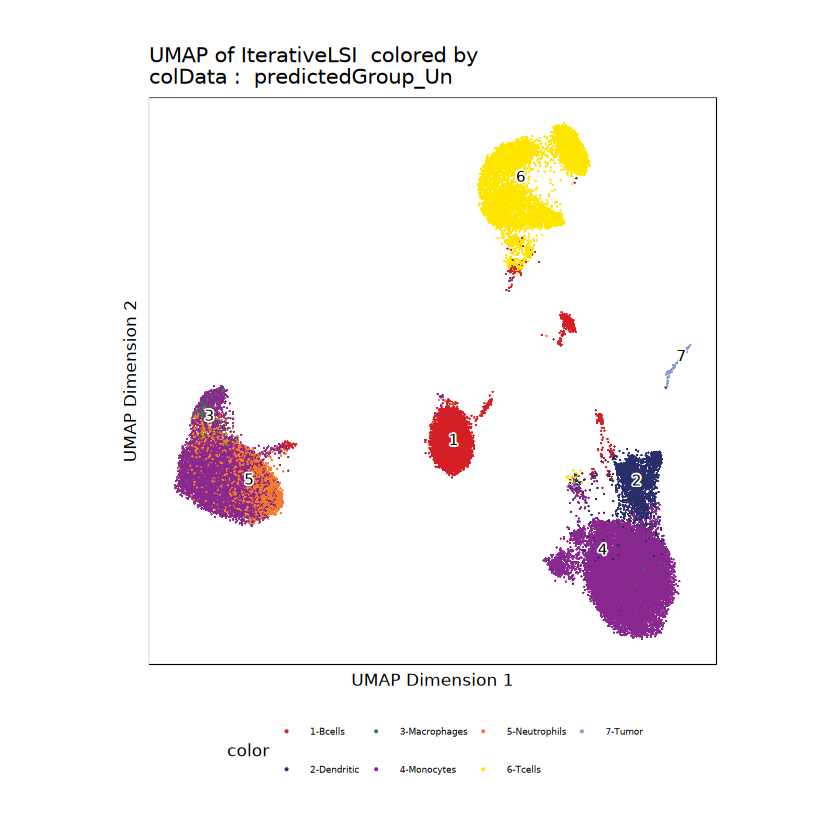

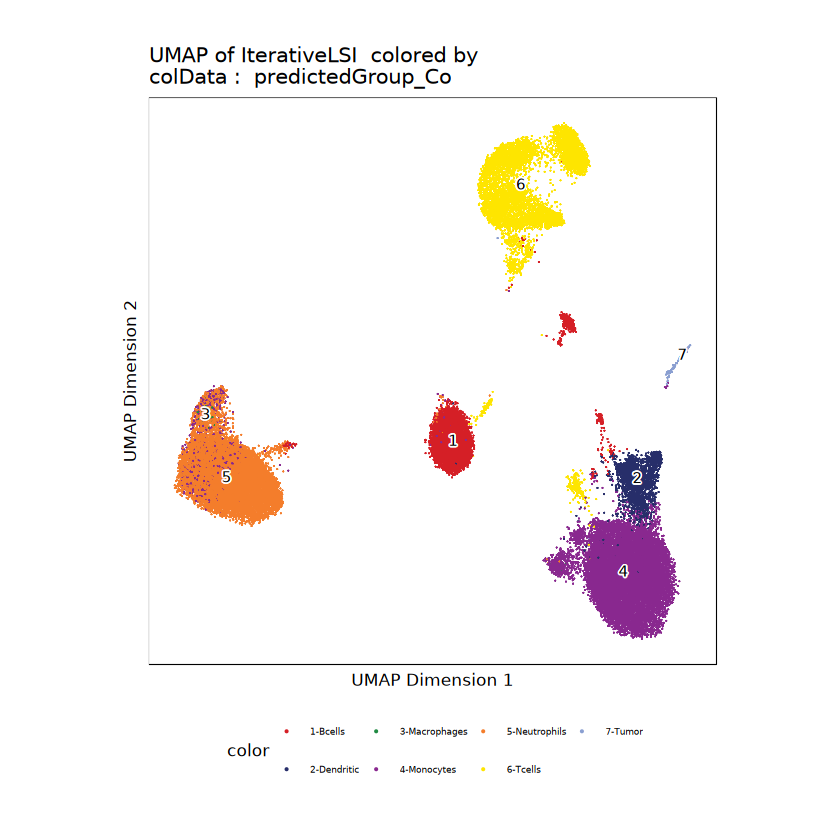

In [39]:
p1 <- plotEmbedding(
    proj, 
    colorBy = "cellColData", 
    name = "predictedGroup_Un", 
    pal = pal
)
p2 <- plotEmbedding(
    proj, 
    colorBy = "cellColData", 
    name = "predictedGroup_Co", 
    pal = pal
)
p1
p2

# Adding Pseudo-scRNA-seq profiles for each scATAC-seq cell

In [38]:
proj <- addGeneIntegrationMatrix(
    ArchRProj = proj, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seurat_object,
    addToArrow = TRUE,
    force= TRUE,
    groupList = groupList,
    groupRNA = "Final_celltypes",
    nameCell = "predictedCell",
    nameGroup = "predictedGroup",
    nameScore = "predictedScore"
)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-1ca6e9e452fa-Date-2024-11-14_Time-09-29-06.415099.log
If there is an issue, please report to github with logFile!

2024-11-14 09:29:06.487799 : Running Seurat's Integration Stuart* et al 2019, 0.001 mins elapsed.

2024-11-14 09:29:06.523464 : Checking ATAC Input, 0.002 mins elapsed.

2024-11-14 09:29:06.610628 : Checking RNA Input, 0.003 mins elapsed.

2024-11-14 09:29:07.784293 : Found 14168 overlapping gene names from gene scores and rna matrix!, 0.023 mins elapsed.

2024-11-14 09:29:07.7872 : Creating Integration Blocks, 0.023 mins elapsed.

2024-11-14 09:29:08.120459 : Prepping Interation Data, 0.028 mins elapsed.

2024-11-14 09:29:08.418383 : Computing Integration in 4 Integration Blocks!, 0 mins elapsed.

2024-11-14 09:29:08.421125 : Block (1 of 4) : Computing Integration, 0 mins elapsed.

2024-11-14 09:29:08.571817 : Block (1 of 4) : Identifying Variable Genes, 0.003 mins elapsed.

2024-11-14 09:29:08.865319 : Block (1 

In [40]:
saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/merged_ArchR_Bladder/manually_filtered 
samples(4): MAZ5 MAZ6 MAZ7 MAZ8
sampleColData names(1): ArrowFiles
cellColData names(24): Sample TSSEnrichment ... predictedGroup
  predictedScore
numberOfCells(1): 39160
medianTSS(1): 24.4405
medianFrags(1): 4076.5

In [41]:
getAvailableMatrices(proj)

[1] "GeneIntegrationMatrix" "GeneScoreMatrix"       "MotifMatrix"          
[4] "PeakMatrix"            "TileMatrix"

In [29]:
markerGenes  <- c(
    "Cd4","Il7r",
    "Cd8a", "Cd8b1","Ccl5",
    "Ngly1", "Nkg7","Klrb1c",
    "Cd79a",  "Cd79b", "Ms4a1",
    "Fcgr3", "Ms4a7",
    "Lyz1", "Cd14","Lgals3", "S100a8",
    "Cst3",
    "Apoe","Lyz2","PAX5",
    "MEIS1",
    "Krt8","Lmna"
  )

In [44]:
proj <- addImputeWeights(proj)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-1ca6e938a6337d-Date-2024-11-14_Time-09-44-40.237933.log
If there is an issue, please report to github with logFile!

2024-11-14 09:44:40.313511 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1ca6e91144ba89-Date-2024-11-14_Time-09-46-39.11567.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2024-11-14 09:46:39.245943 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1ca6e91144ba89-Date-2024-11-14_Time-09-46-39.11567.log



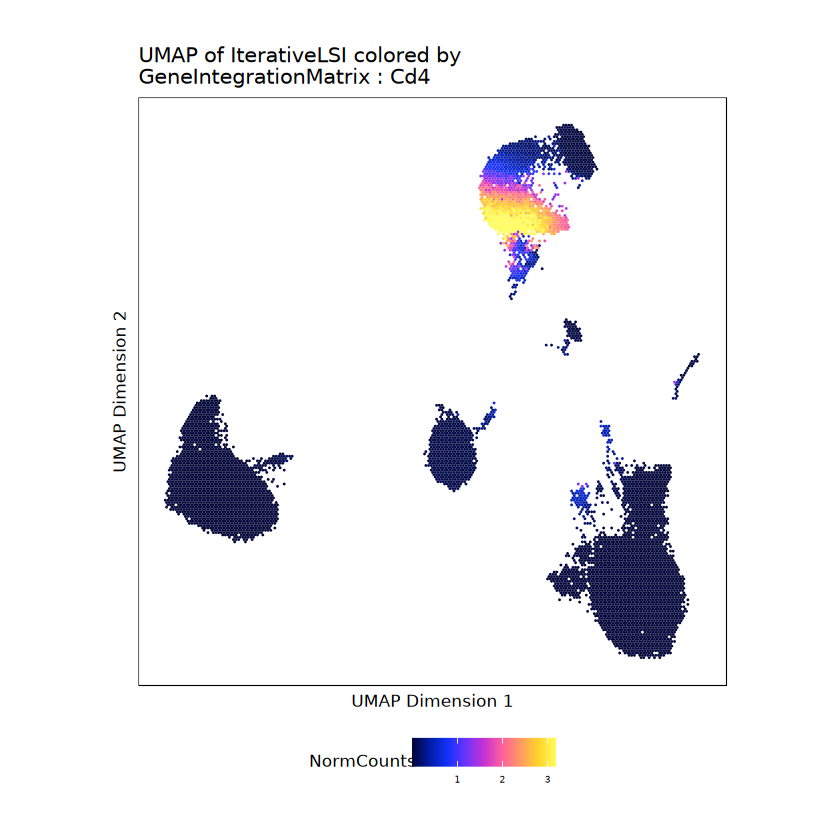

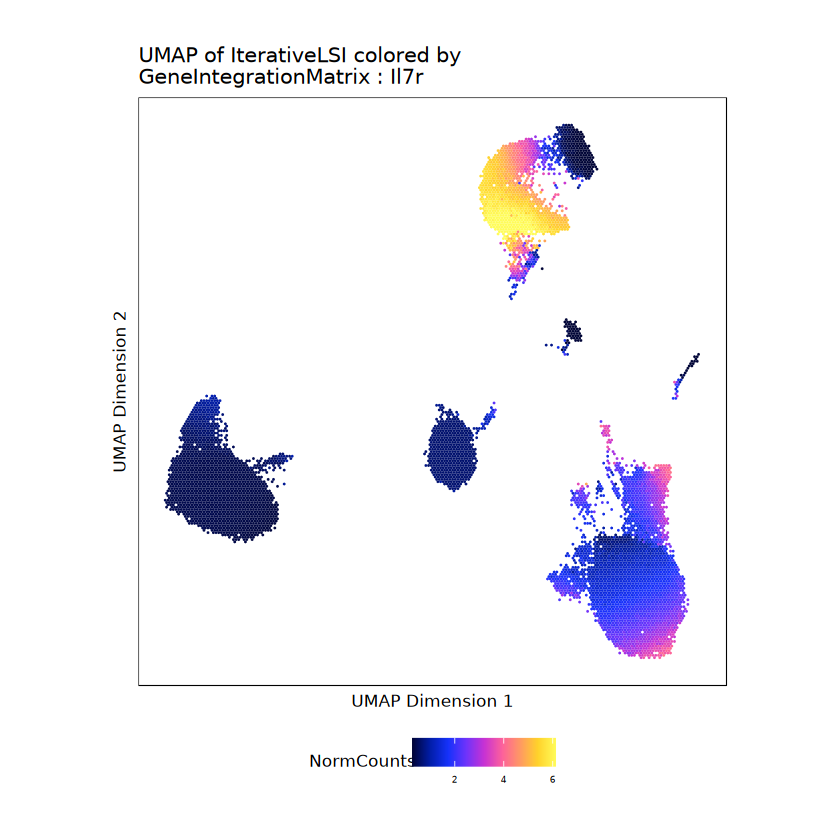

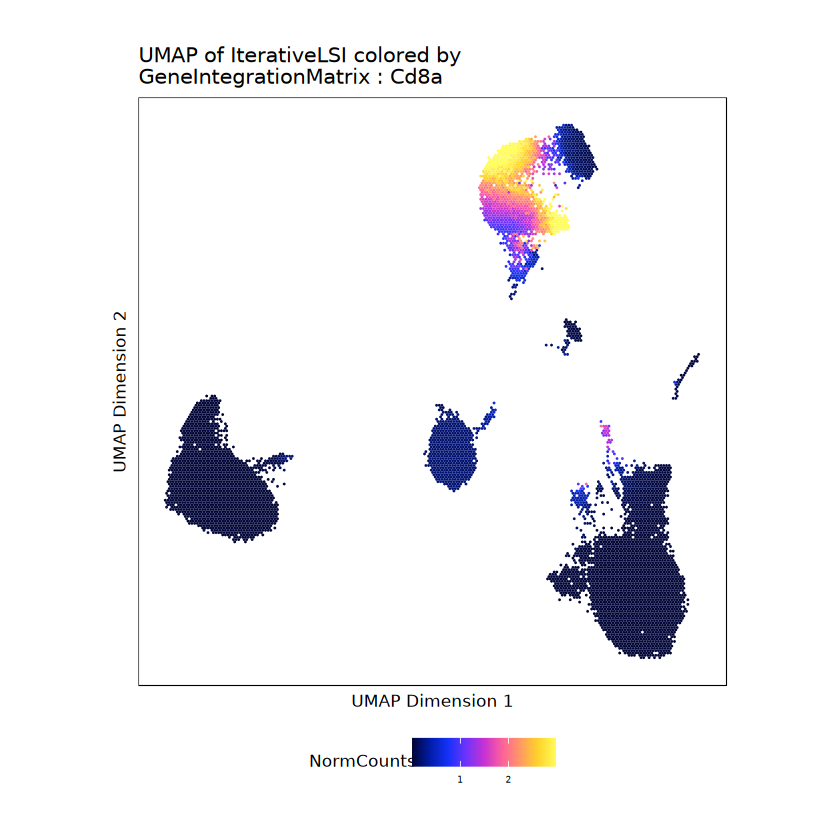

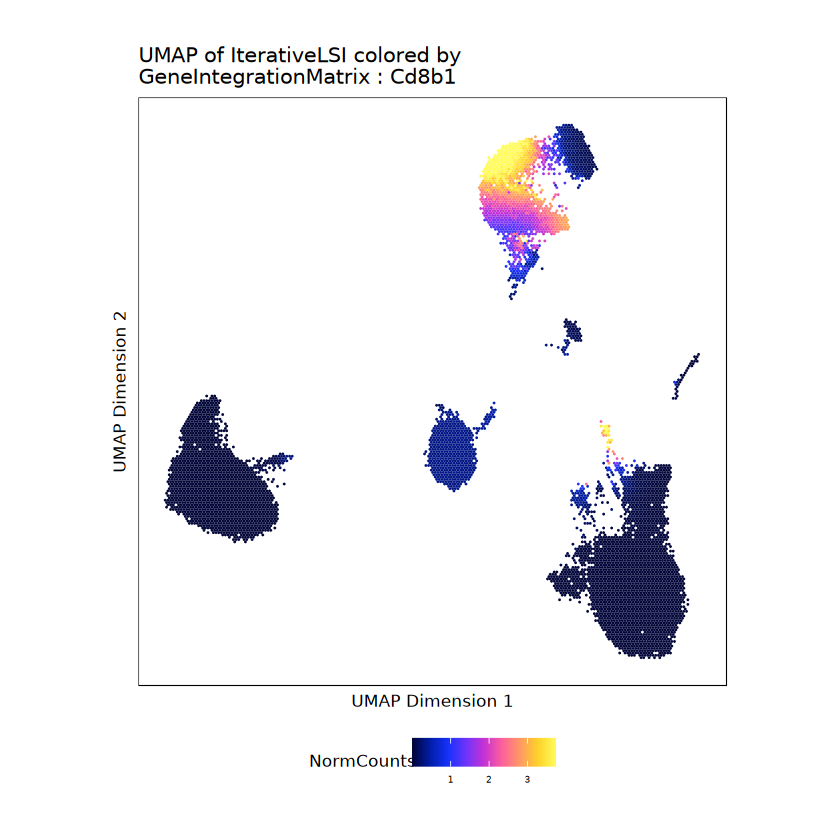

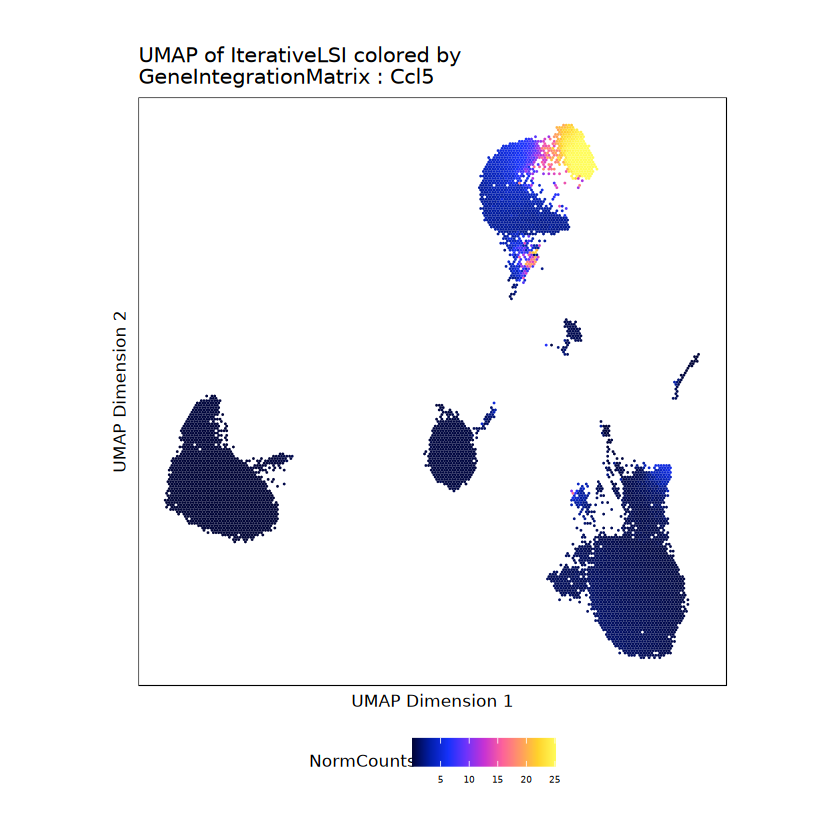

...

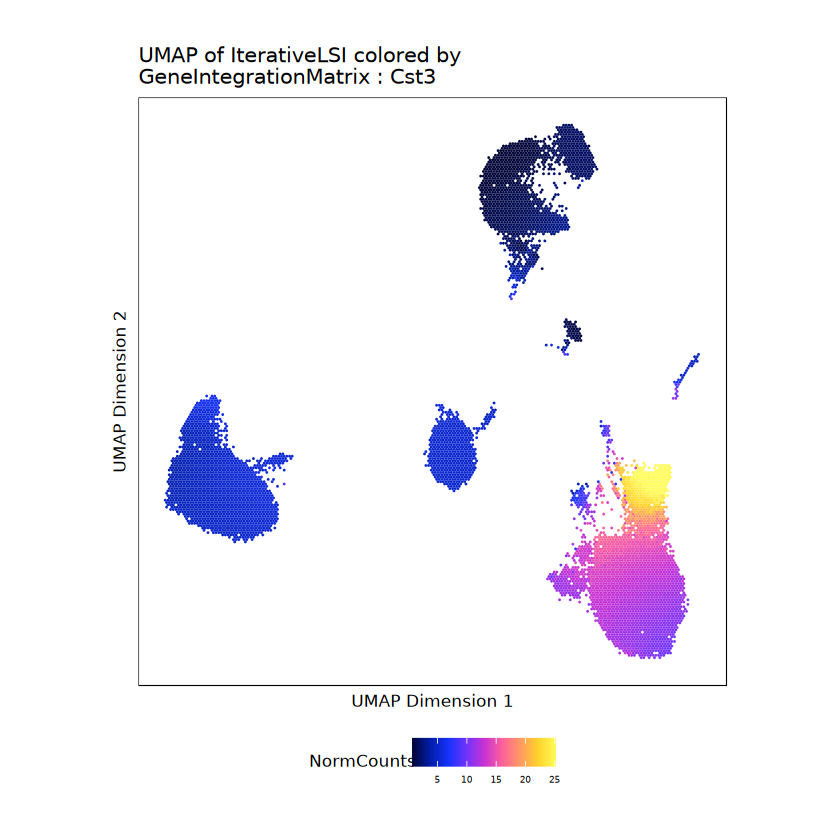

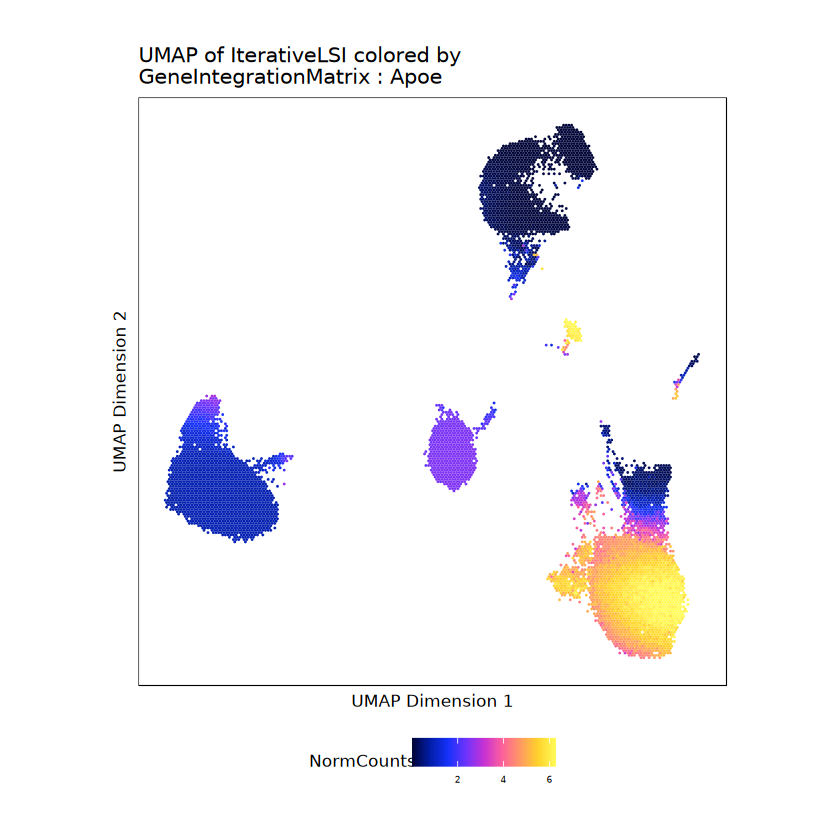

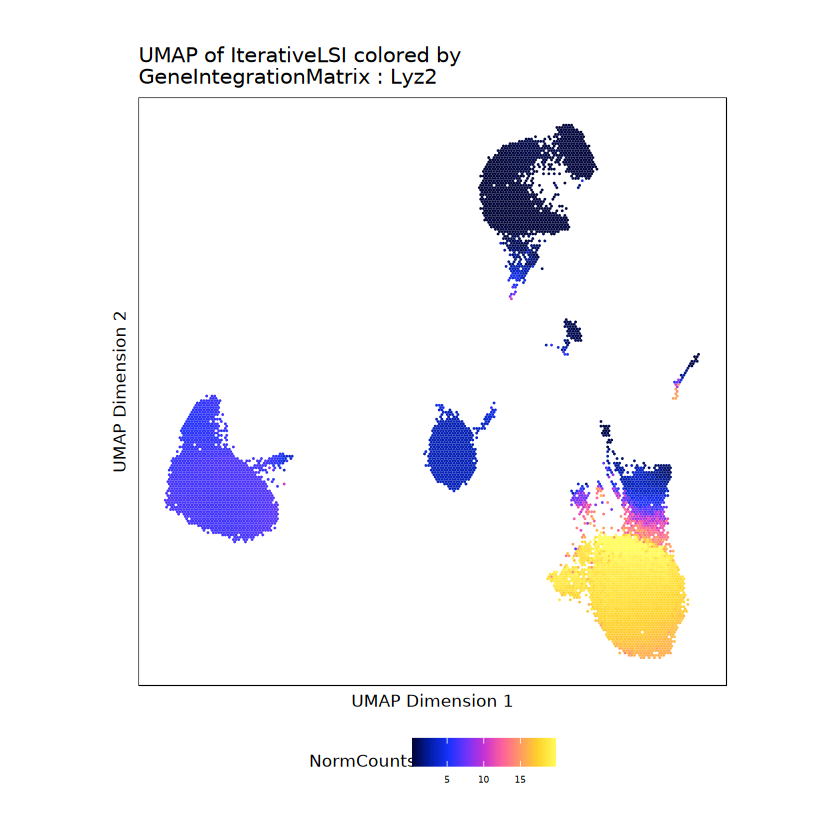

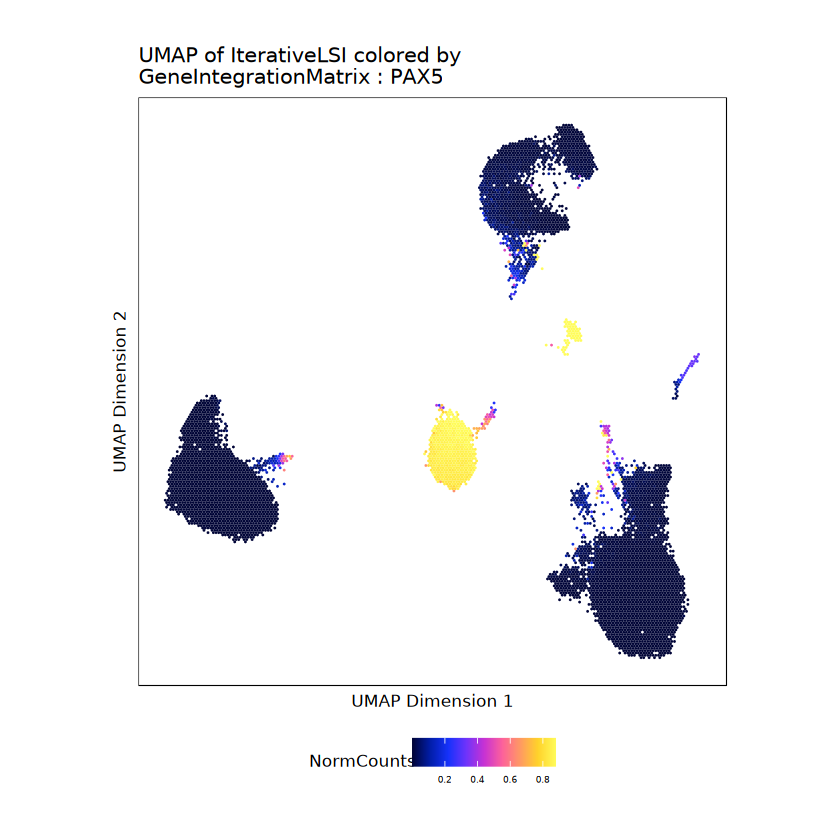

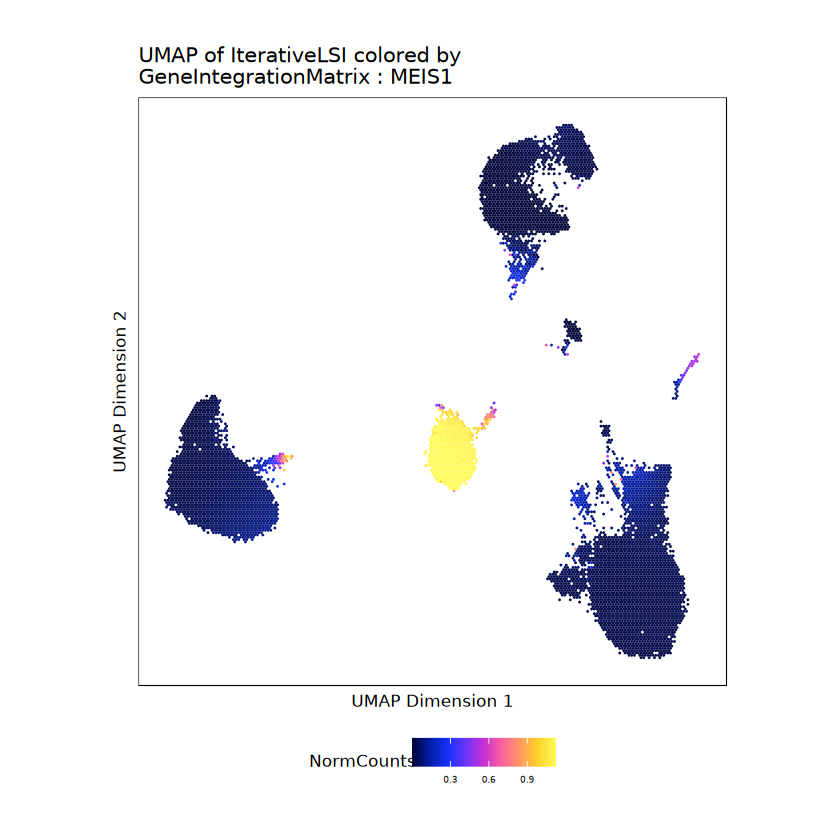

$Cd4

$Il7r

$Cd8a

$Cd8b1

$Ccl5

$Ngly1

$Nkg7

$Klrb1c

$Cd79a

$Cd79b

$Ms4a1

$Fcgr3

$Ms4a7

$Lyz1

$Cd14

$Lgals3

$S100a8

$Cst3

$Apoe

$Lyz2

$PAX5

$MEIS1

$Krt8

$Lmna


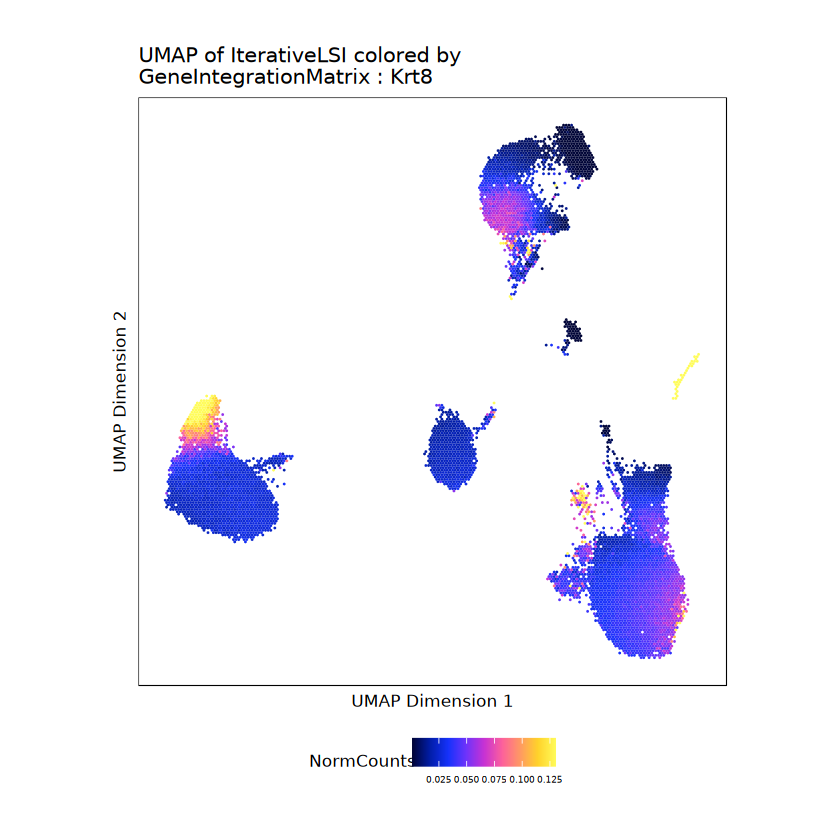

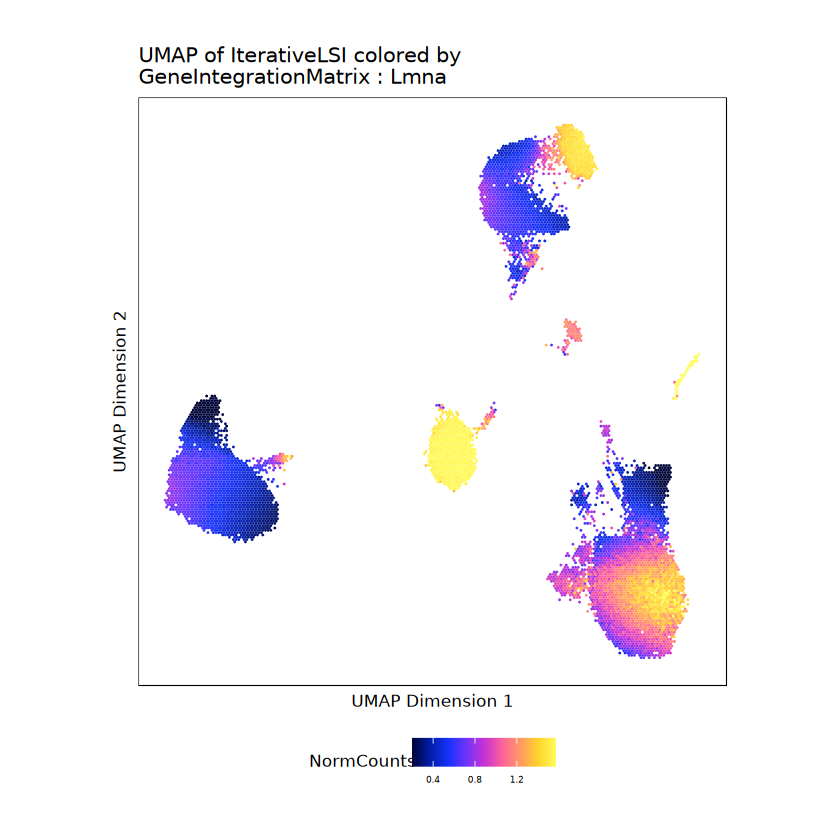

In [45]:
p_genes <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneIntegrationMatrix", 
    name = markerGenes, 
    embedding = "UMAP",
    continuousSet = "horizonExtra",
    imputeWeights = getImputeWeights(proj)
)
p_genes

# Motif Markers

In [6]:
motifs <- c("EBF1", "PAX5", "PU.1", "CEBPa", "TCF1", "TCF7","RUNX")
markerMotifs <- getFeatures(proj, select = paste(motifs, collapse="|"), useMatrix = "MotifMatrix")
markerMotifs

[1] "z:Runx3_858"           "z:Tcf7l1_744"          "z:Tcf7l2_732"         
 [4] "z:Tcf7_726"            "z:Runx2_713"           "z:Runx1_712"          
 [7] "z:Pax5_694"            "z:Cebpa_115"           "z:Tcf15_93"           
[10] "z:Ebf1_90"             "z:Tcf12_59"            "z:Srebf1_32"          
[13] "deviations:Runx3_858"  "deviations:Tcf7l1_744" "deviations:Tcf7l2_732"
[16] "deviations:Tcf7_726"   "deviations:Runx2_713"  "deviations:Runx1_712" 
[19] "deviations:Pax5_694"   "deviations:Cebpa_115"  "deviations:Tcf15_93"  
[22] "deviations:Ebf1_90"    "deviations:Tcf12_59"   "deviations:Srebf1_32"

In [7]:
markerMotifs <- sort(grep("z:", markerMotifs, value = TRUE))
markerMotifs

[1] "z:Cebpa_115"  "z:Ebf1_90"    "z:Pax5_694"   "z:Runx1_712"  "z:Runx2_713" 
 [6] "z:Runx3_858"  "z:Srebf1_32"  "z:Tcf12_59"   "z:Tcf15_93"   "z:Tcf7_726"  
[11] "z:Tcf7l1_744" "z:Tcf7l2_732"

In [8]:
markerMotifs <- c('z:Ebf1_90','z:Pax5_694','z:Srebf1_32','z:Cebpa_115',
                 'z:Tcf12_59','z:Tcf15_93','z:Tcf7_726','z:Tcf7l1_744','z:Tcf7l2_732',
                 'z:Runx1_712','z:Runx2_713','z:Runx3_858')

Getting ImputeWeights

Getting Matrix Values...

2024-11-19 13:12:28.11717 : 

1 
2 
3 
4 


ArchR logging to : ArchRLogs/ArchR-imputeMatrix-3b9d633c4dc6cf-Date-2024-11-19_Time-13-12-31.791694.log
If there is an issue, please report to github with logFile!

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 


Picking joint bandwidth of 0.0407

Picking joint bandwidth of 0.0207



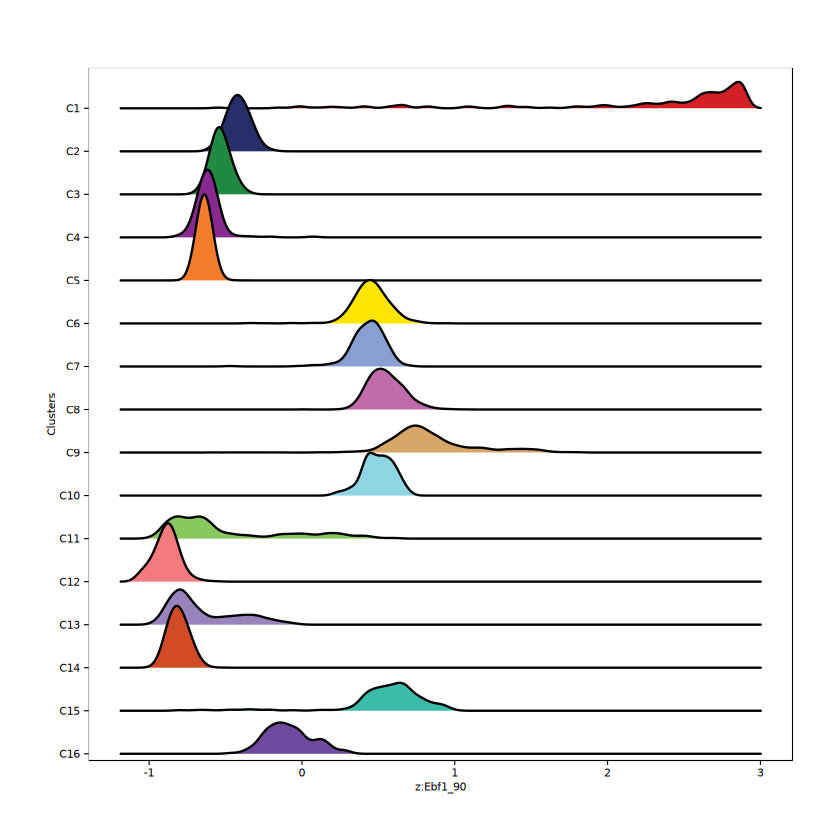

Picking joint bandwidth of 0.0345



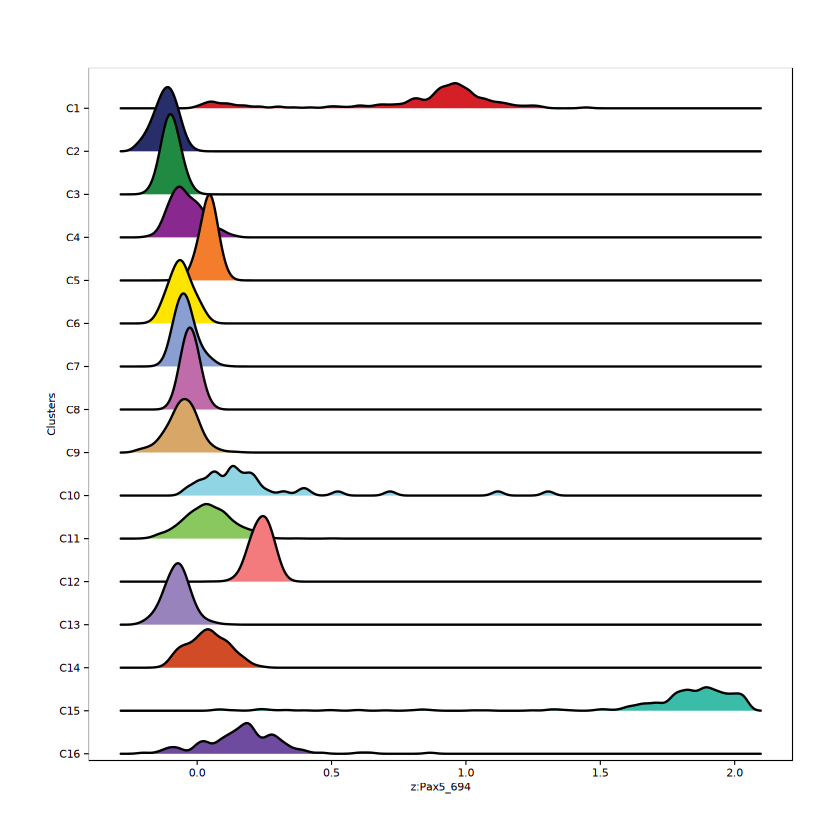

Picking joint bandwidth of 0.0574



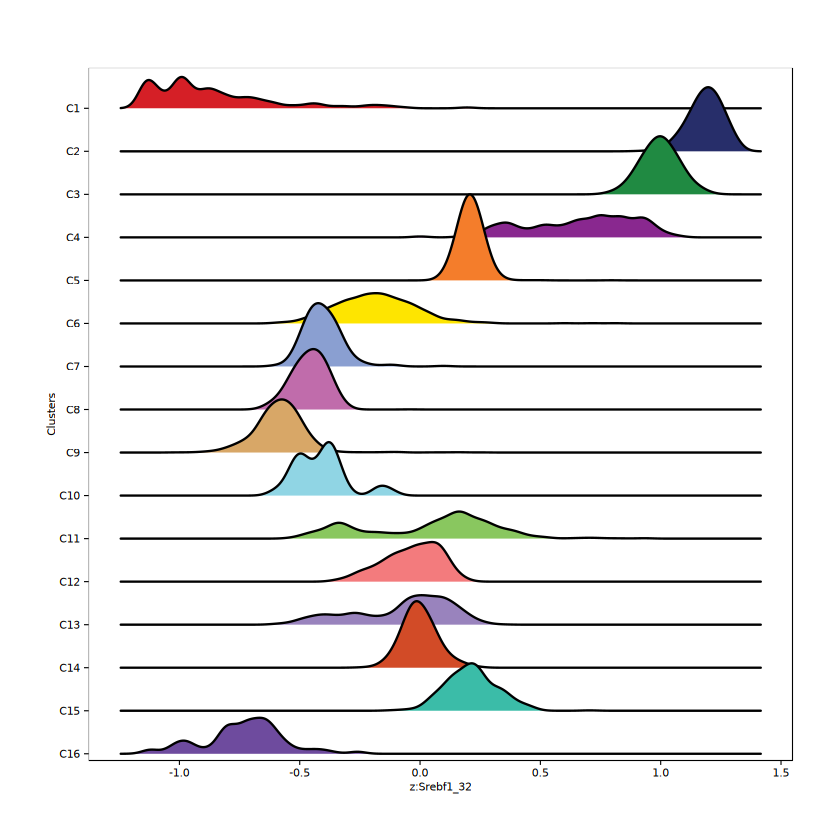

Picking joint bandwidth of 0.107



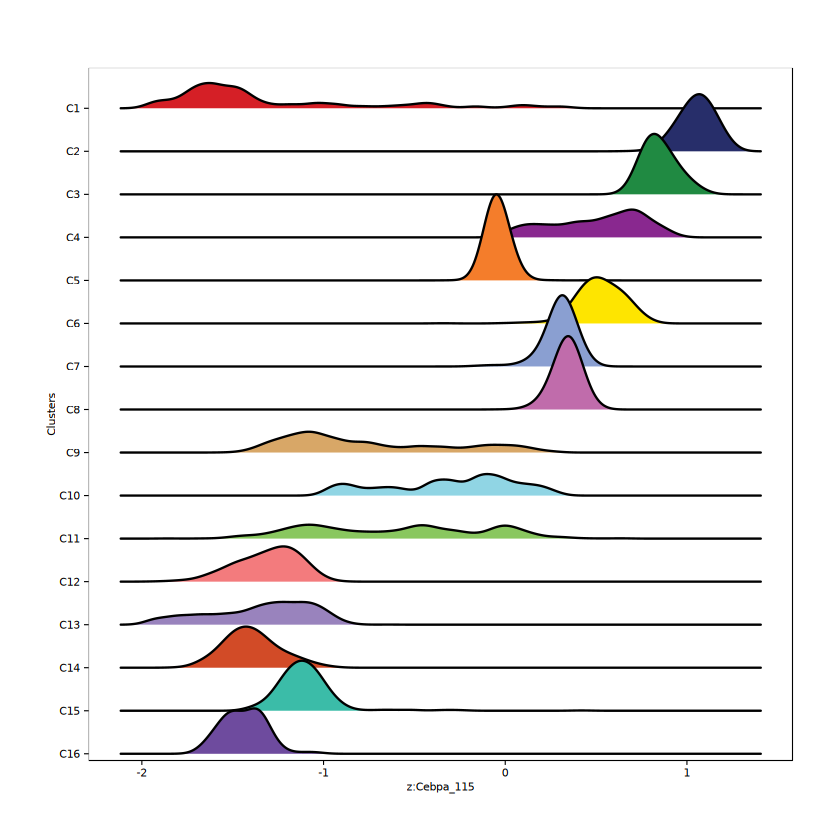

Picking joint bandwidth of 0.029



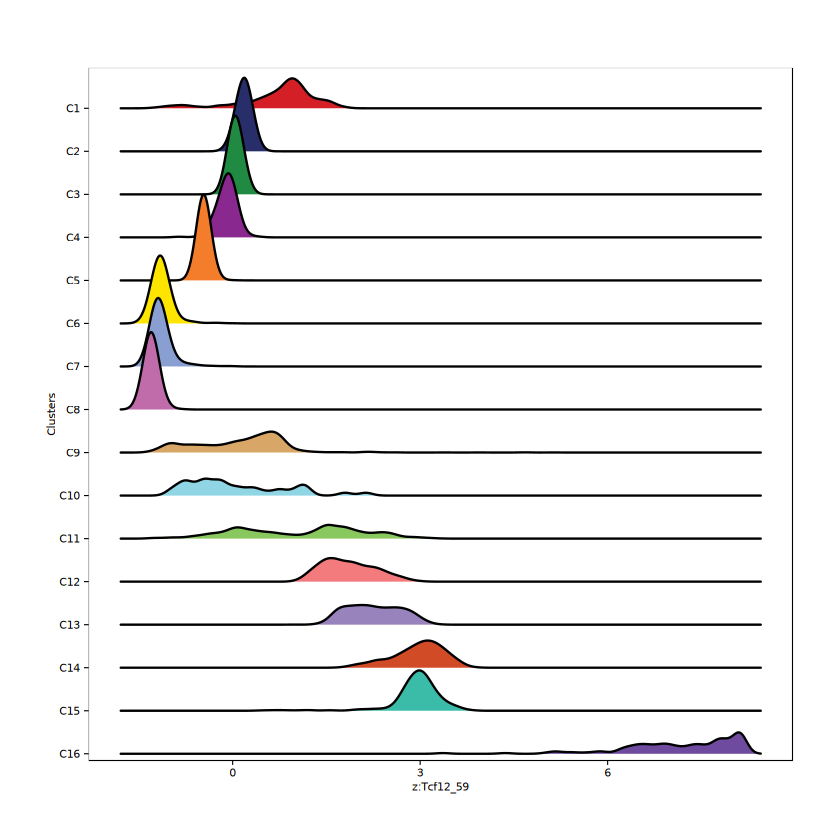

Picking joint bandwidth of 0.0494



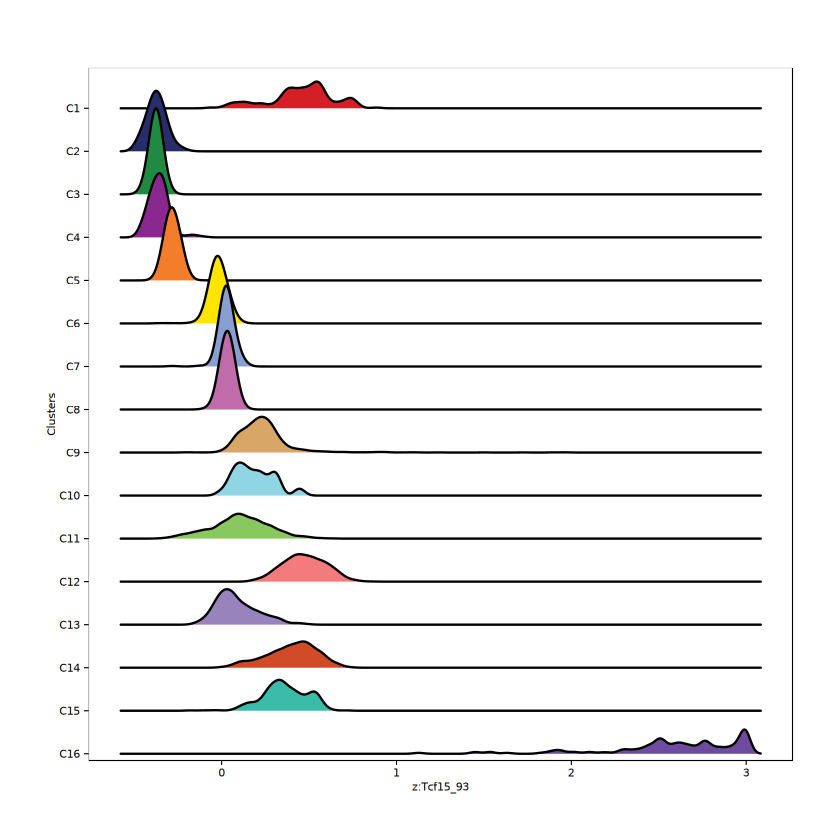

Picking joint bandwidth of 0.0487



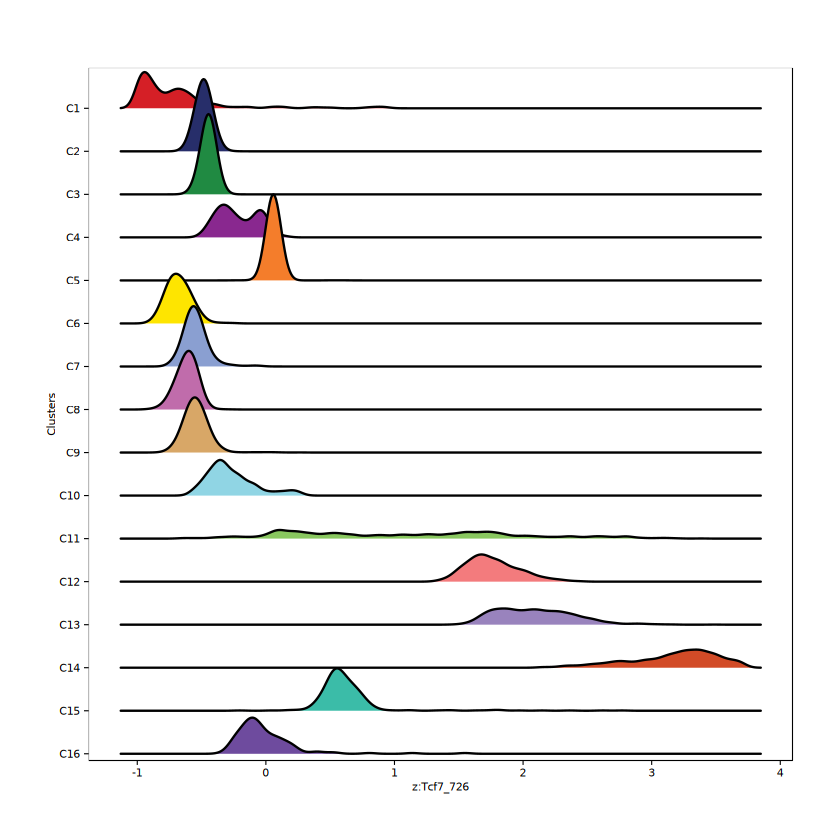

Picking joint bandwidth of 0.054



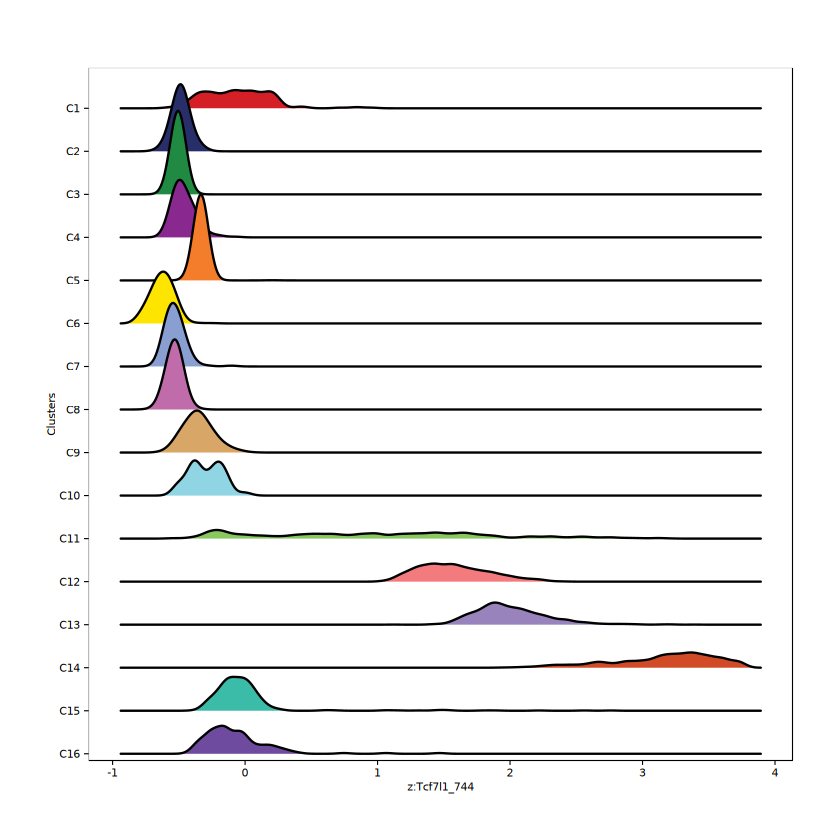

Picking joint bandwidth of 0.0945



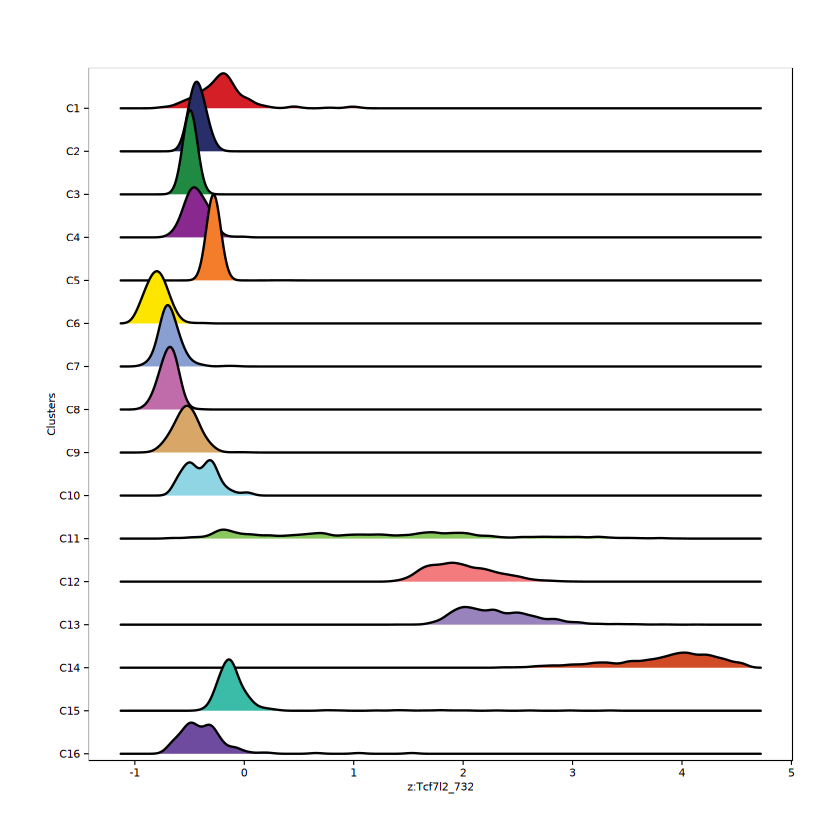

Picking joint bandwidth of 0.0827



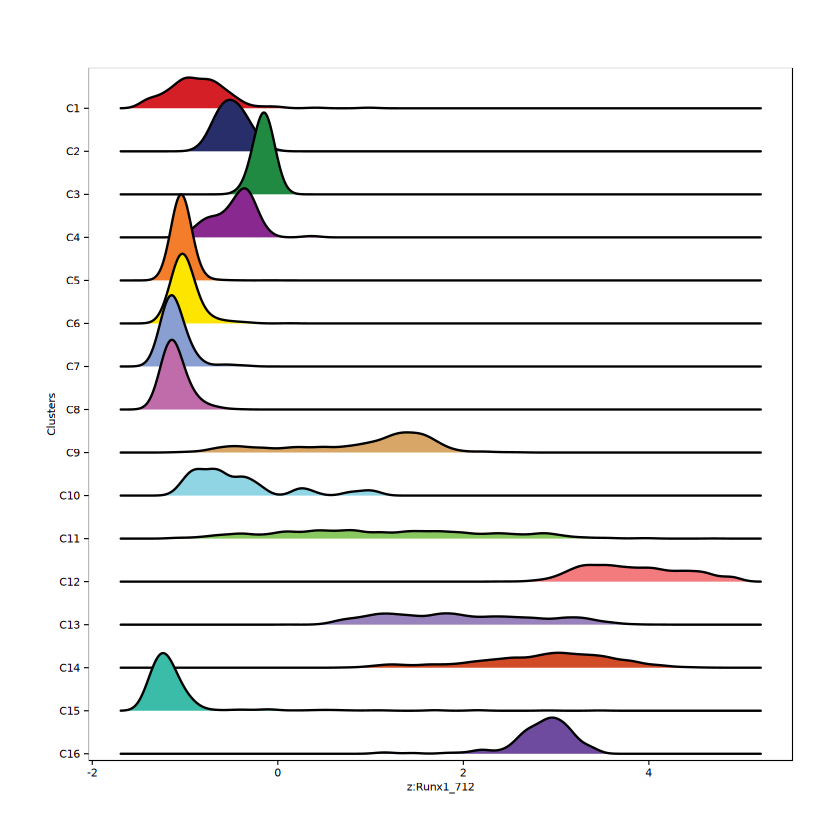

Picking joint bandwidth of 0.0945



$`z:Ebf1_90`

$`z:Pax5_694`

$`z:Srebf1_32`

$`z:Cebpa_115`

$`z:Tcf12_59`

$`z:Tcf15_93`

$`z:Tcf7_726`

$`z:Tcf7l1_744`

$`z:Tcf7l2_732`

$`z:Runx1_712`

$`z:Runx2_713`

$`z:Runx3_858`


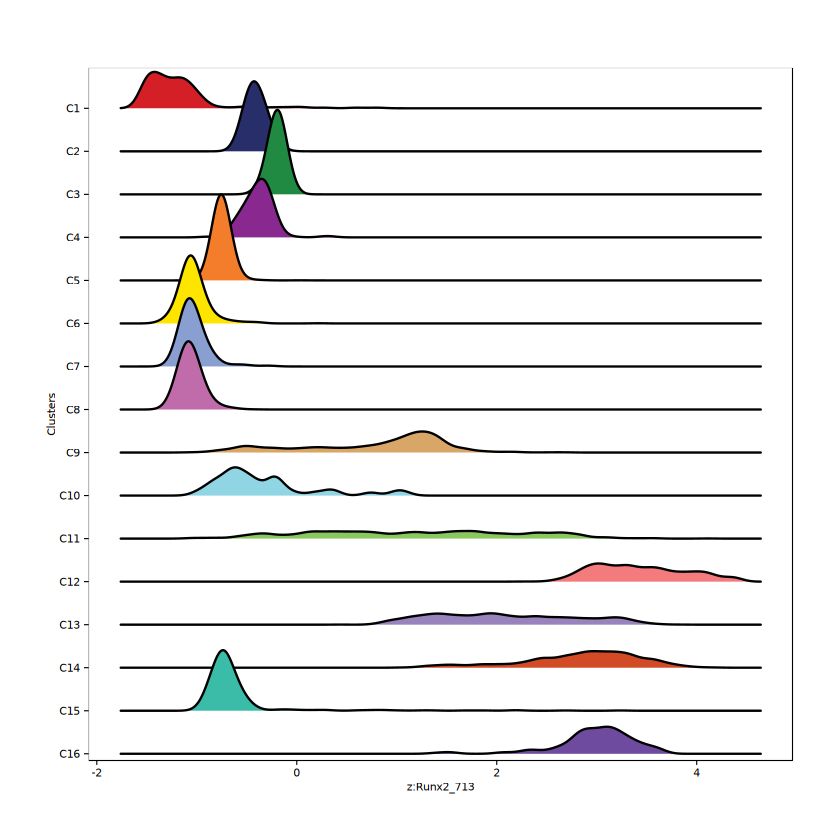

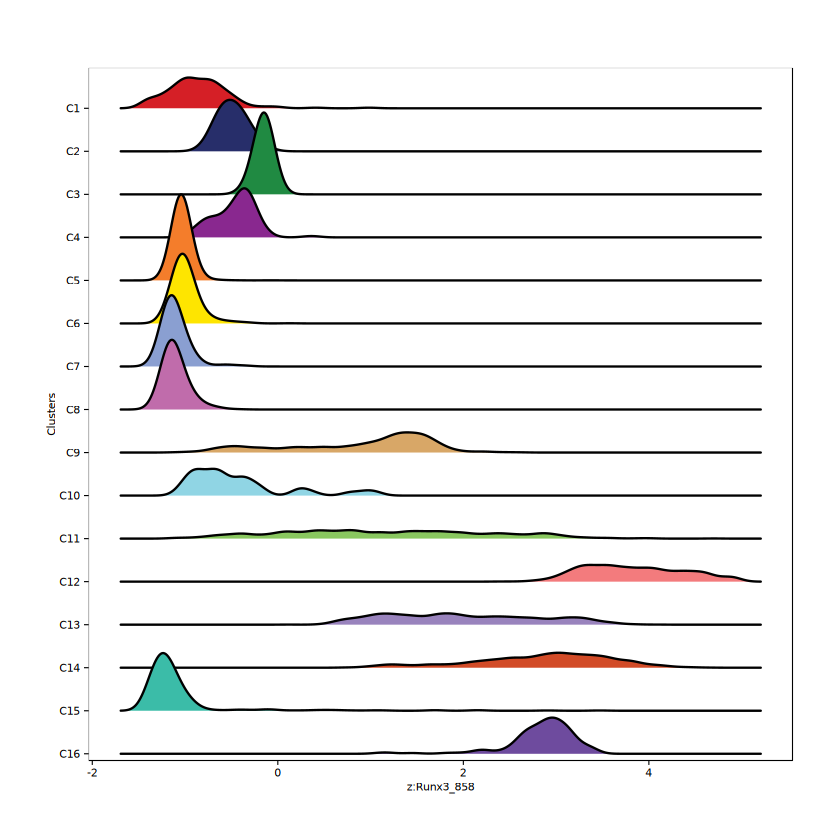

In [70]:
p_motifs <- plotGroups(ArchRProj = proj, 
  groupBy = "Clusters", 
  colorBy = "MotifMatrix", 
  name = markerMotifs,
  imputeWeights = getImputeWeights(proj)
)
p_motifs

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3b9d634d0681f3-Date-2024-11-19_Time-13-13-47.067236.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2024-11-19 13:13:47.275197 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3b9d634d0681f3-Date-2024-11-19_Time-13-13-47.067236.log



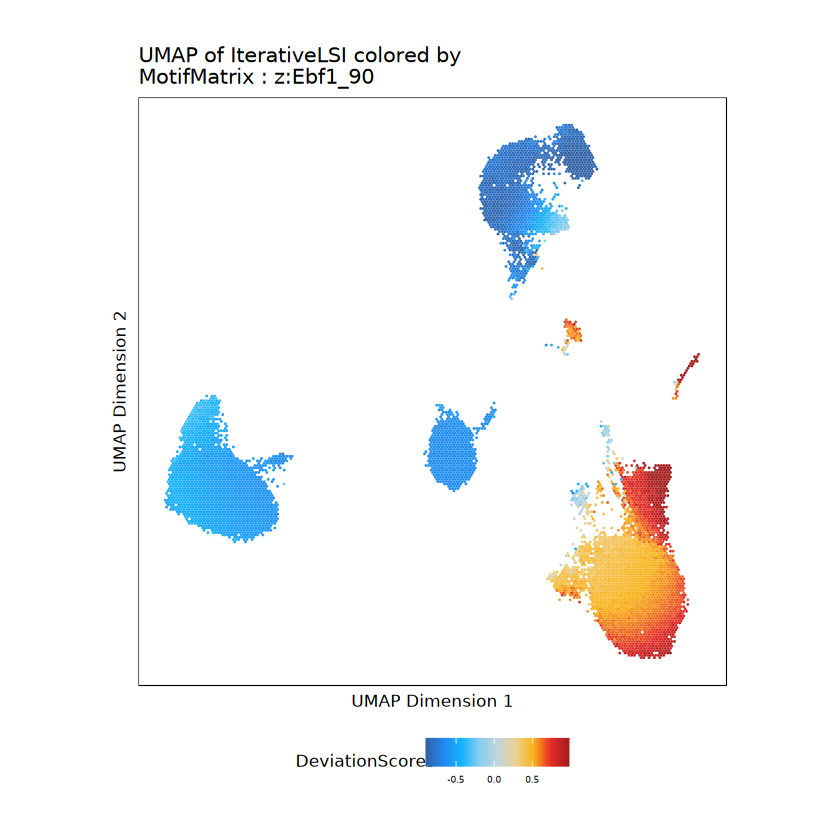

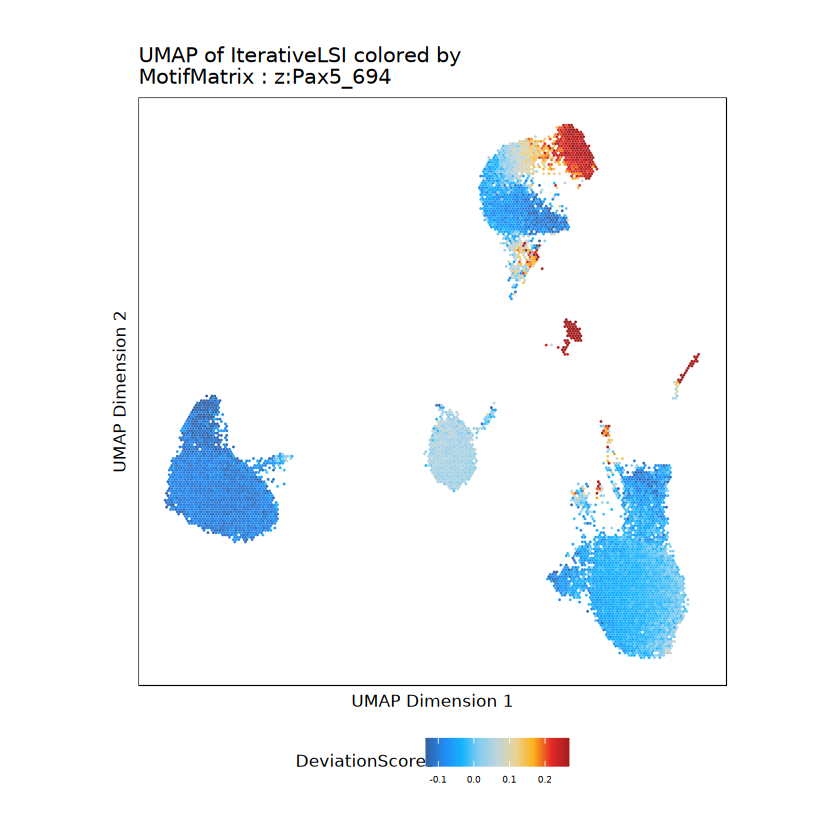

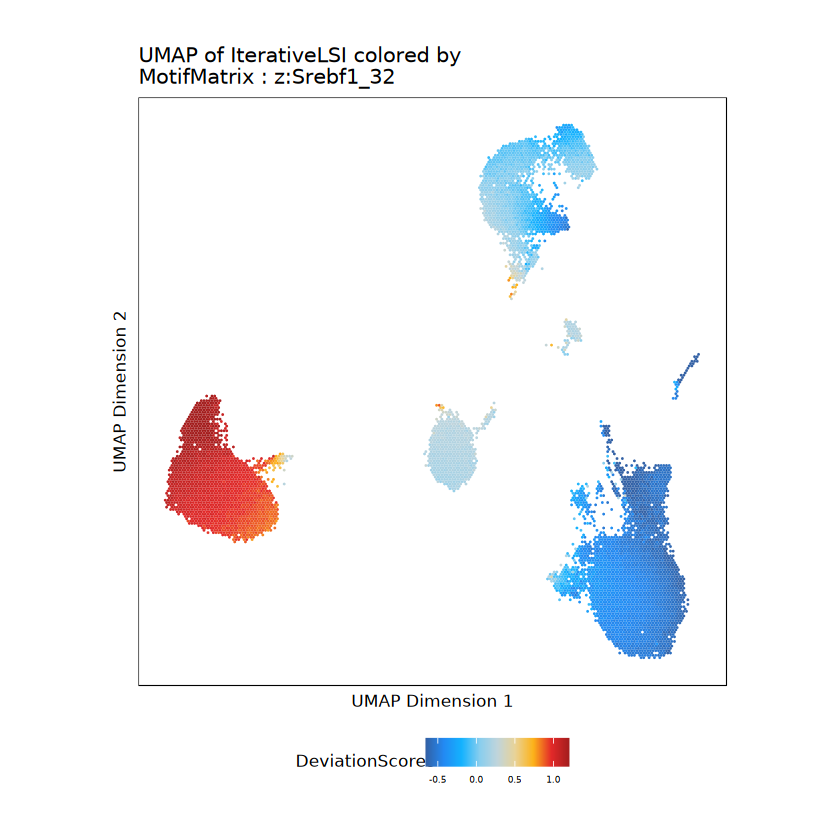

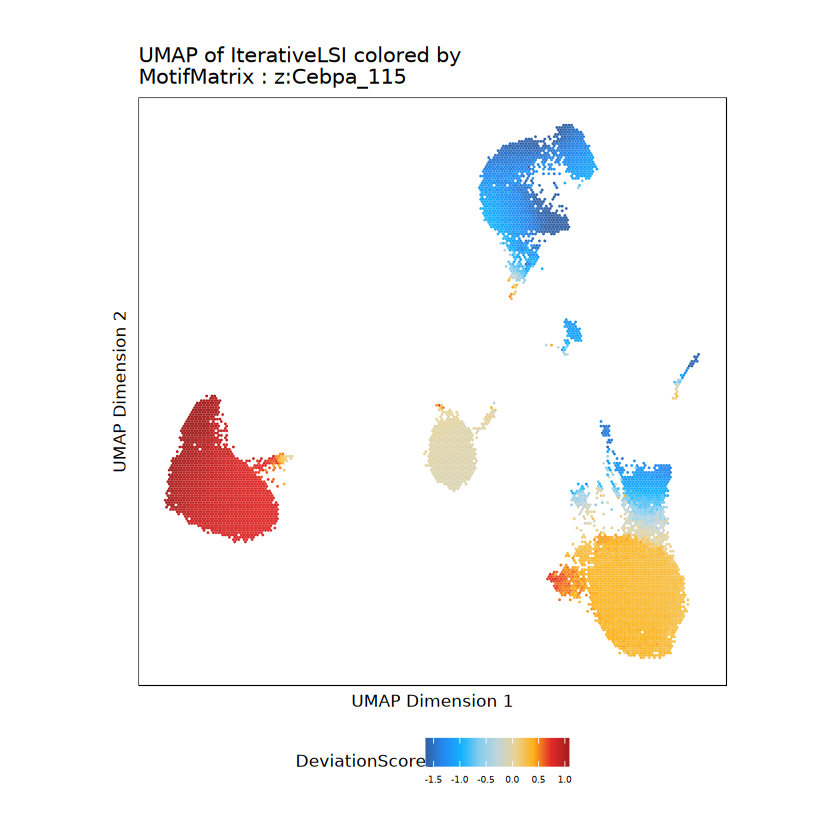

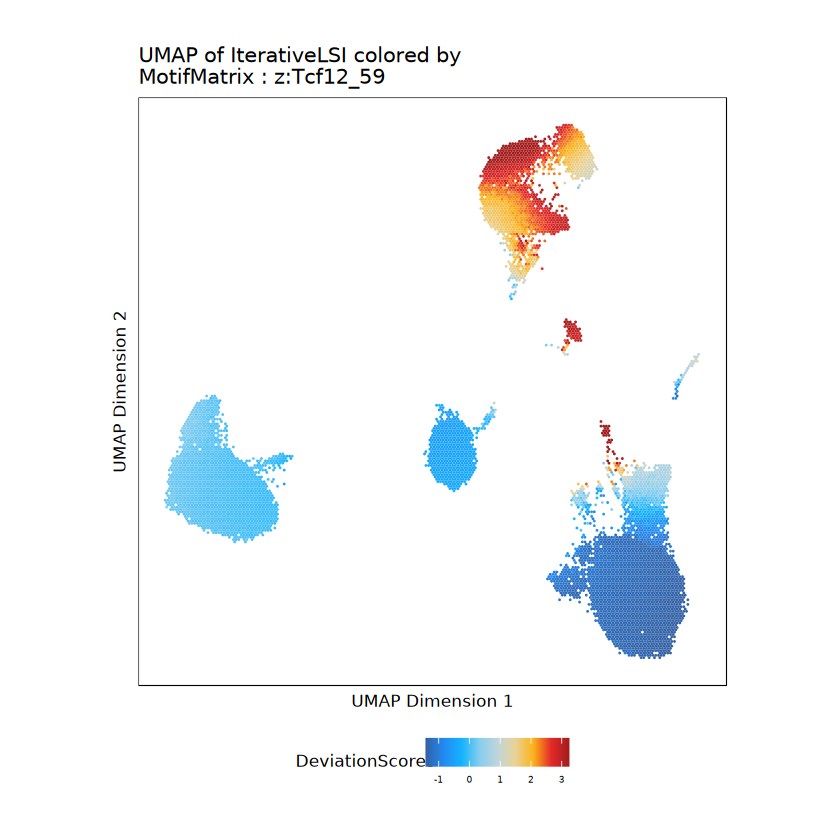

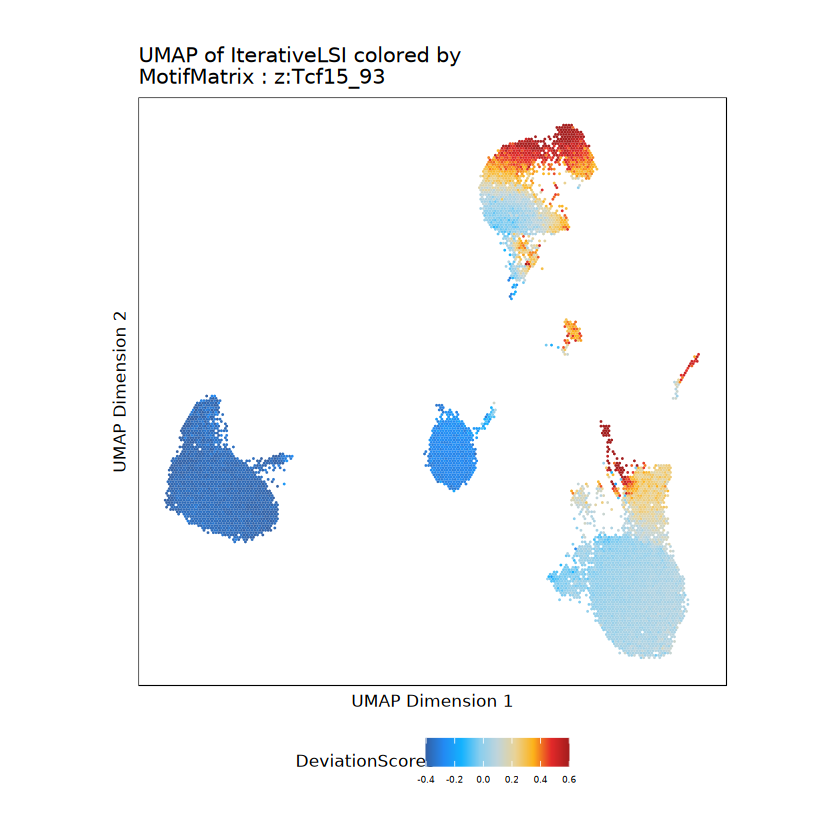

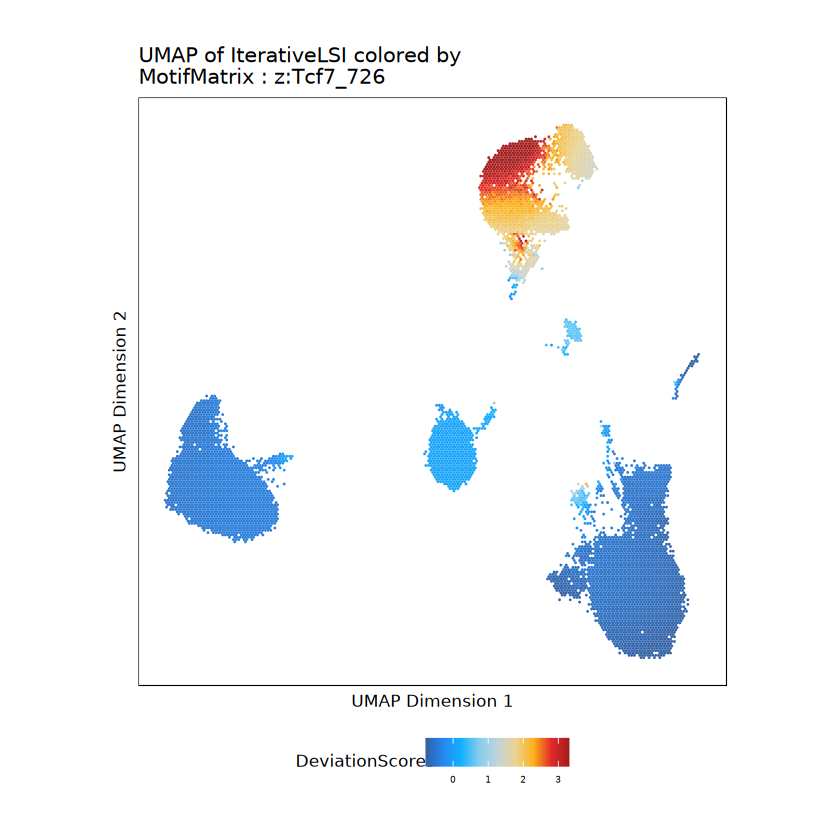

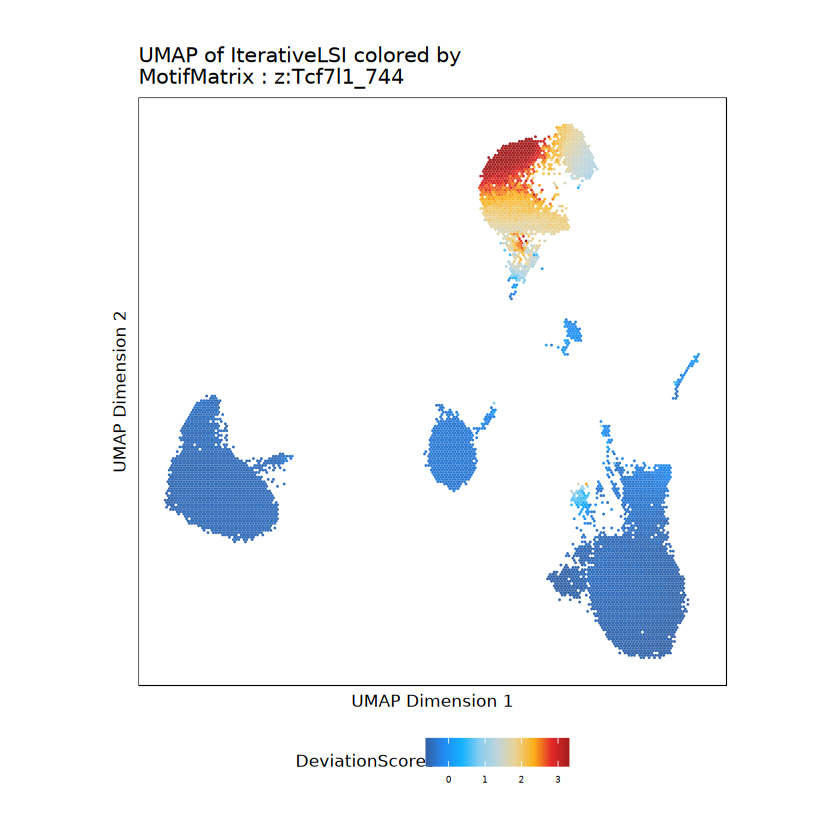

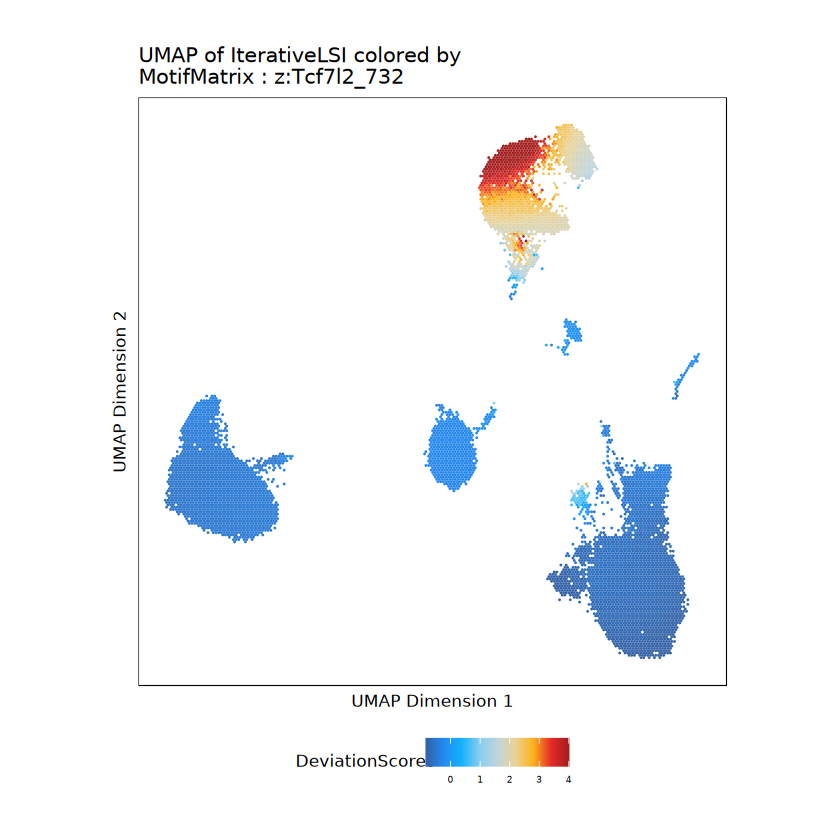

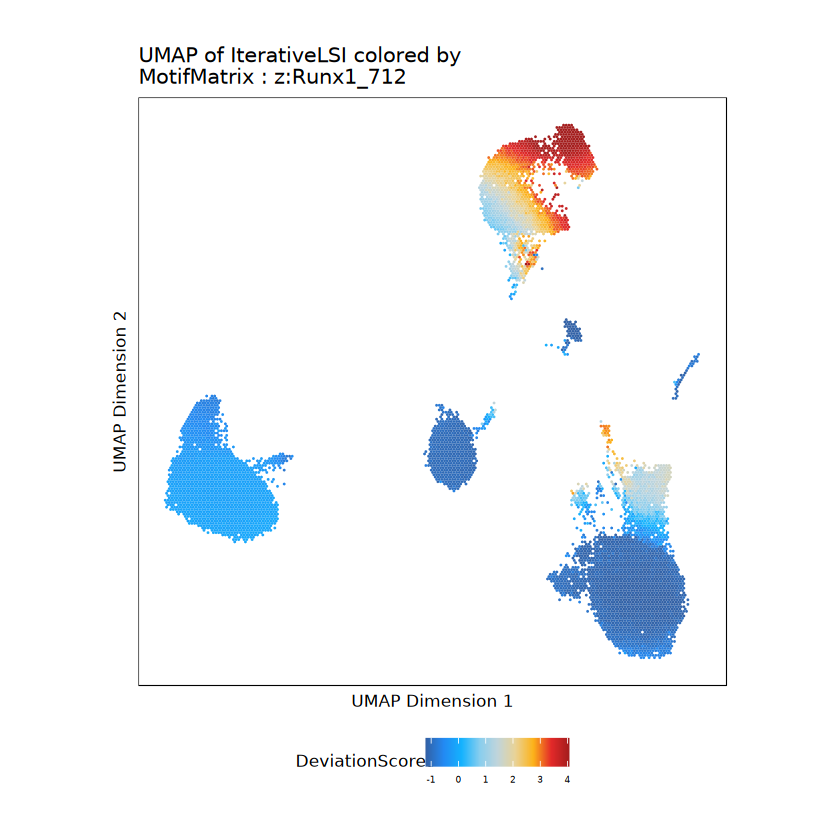

$`z:Ebf1_90`

$`z:Pax5_694`

$`z:Srebf1_32`

$`z:Cebpa_115`

$`z:Tcf12_59`

$`z:Tcf15_93`

$`z:Tcf7_726`

$`z:Tcf7l1_744`

$`z:Tcf7l2_732`

$`z:Runx1_712`

$`z:Runx2_713`

$`z:Runx3_858`


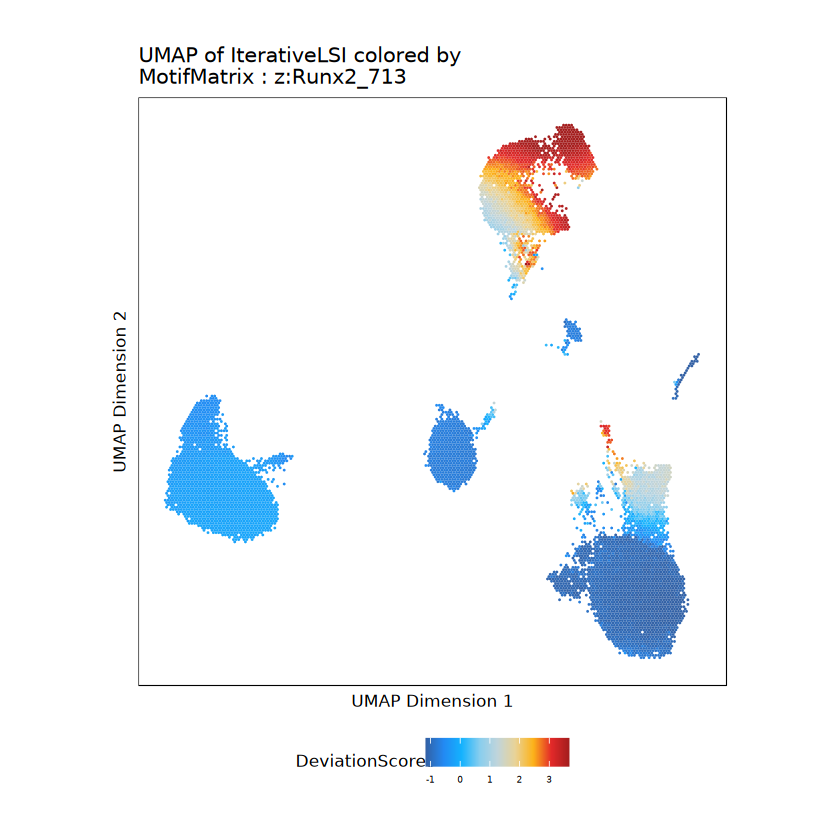

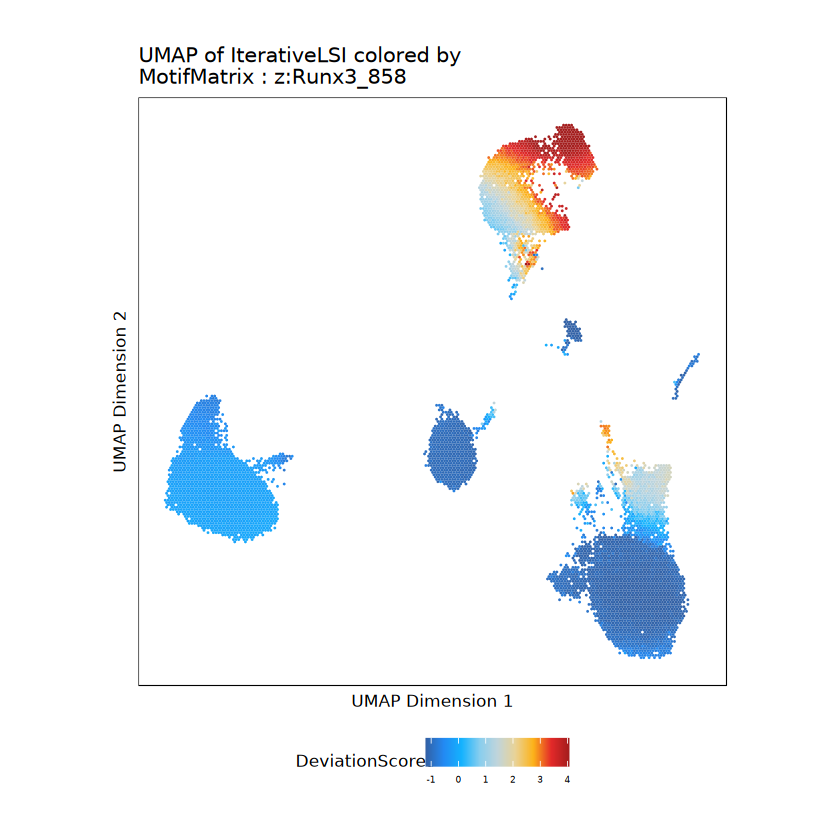

In [73]:
p_motifs_3 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "MotifMatrix", 
    name = markerMotifs, 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(proj)
)
p_motifs_3

In [13]:
markerRNA <- getFeatures(proj, select = paste(motifs, collapse="|"), useMatrix = "GeneScoreMatrix")
sort(markerRNA)

[1] "Cebpa"    "Ebf1"     "Herpud1"  "Hnrnpul1" "Pax5"     "Pum1"    
 [7] "Pus1"     "Pus10"    "Runx1"    "Runx1t1"  "Runx2"    "Runx3"   
[13] "Srebf1"   "Tcf12"    "Tcf15"    "Tcf19"    "Tcf7"     "Tcf7l1"  
[19] "Tcf7l2"

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3b9d63564c1d1c-Date-2024-11-19_Time-13-14-21.937257.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2024-11-19 13:14:22.118603 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3b9d63564c1d1c-Date-2024-11-19_Time-13-14-21.937257.log



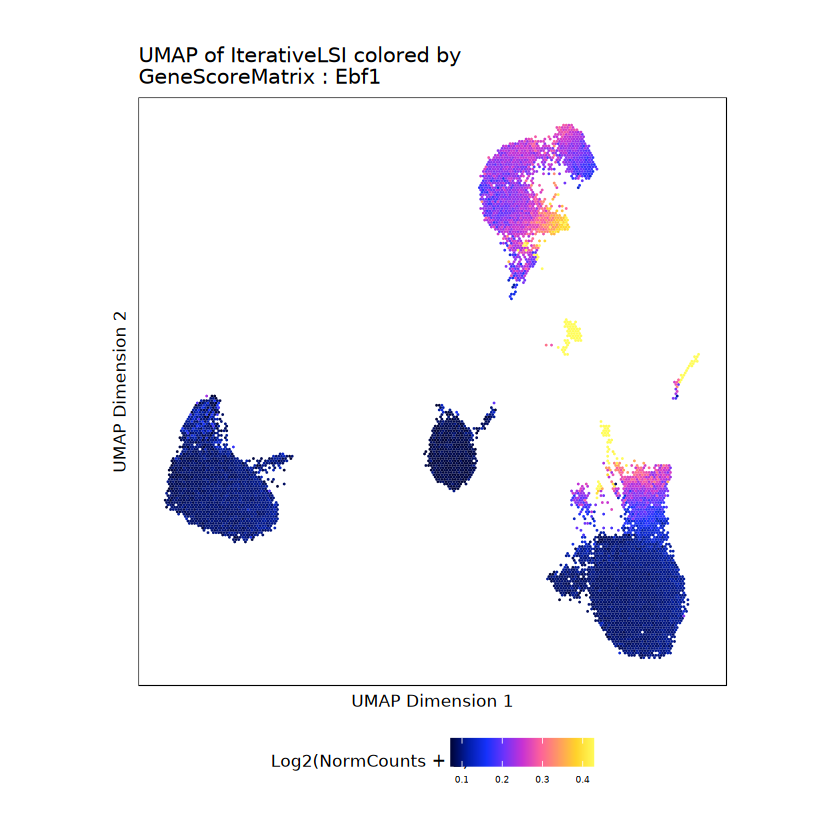

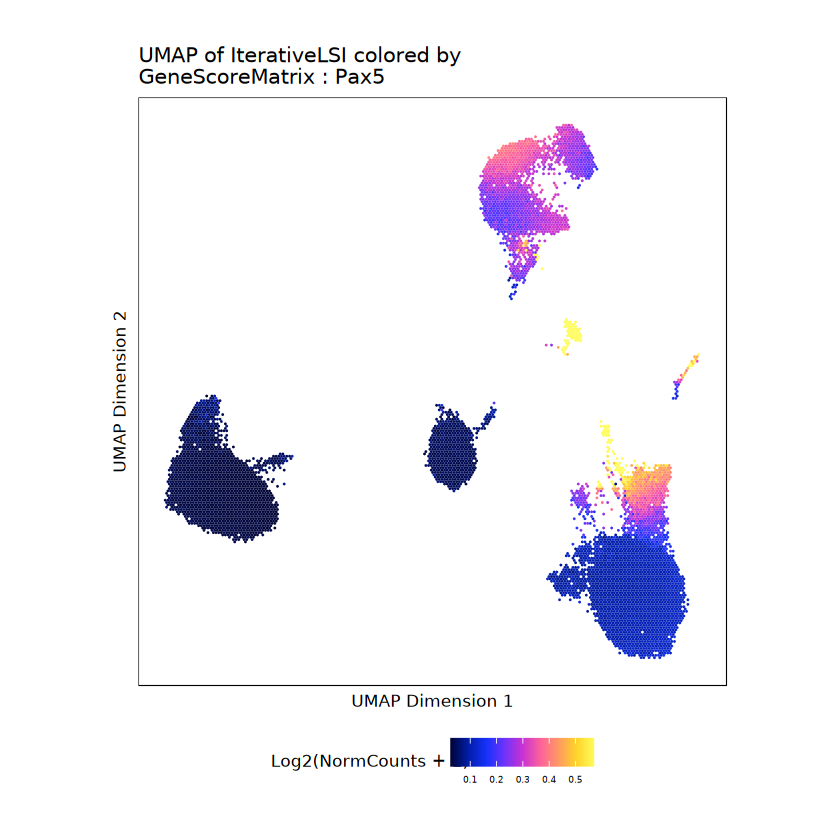

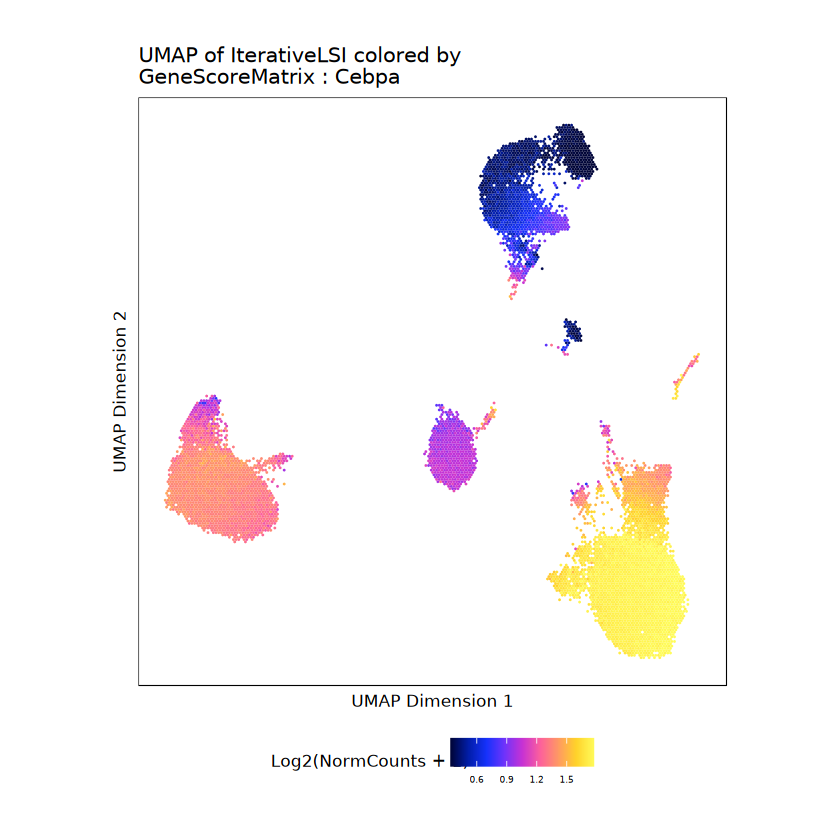

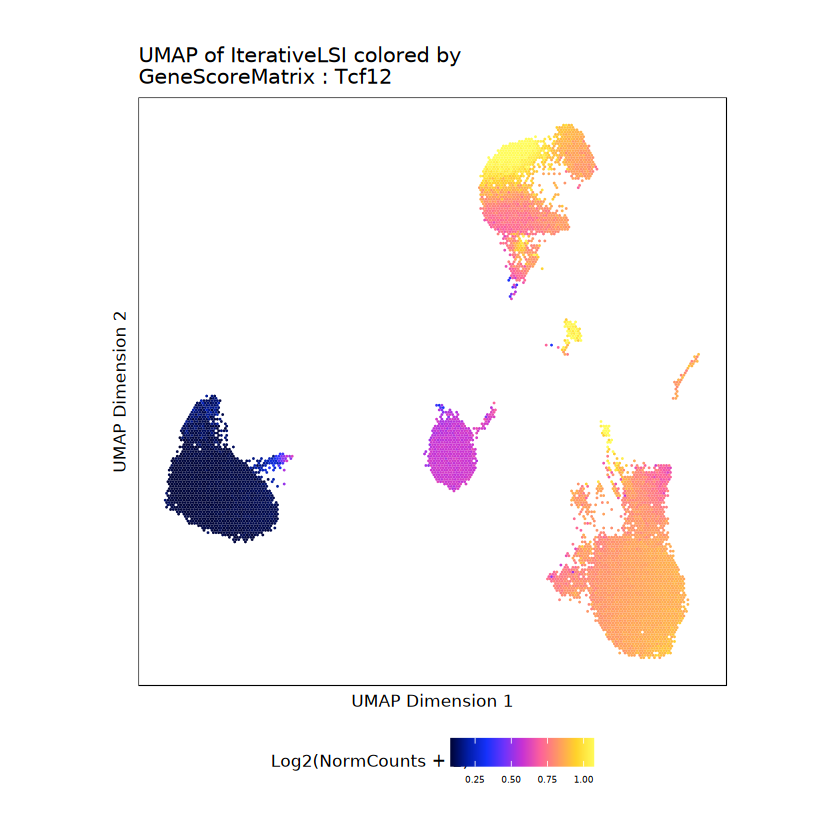

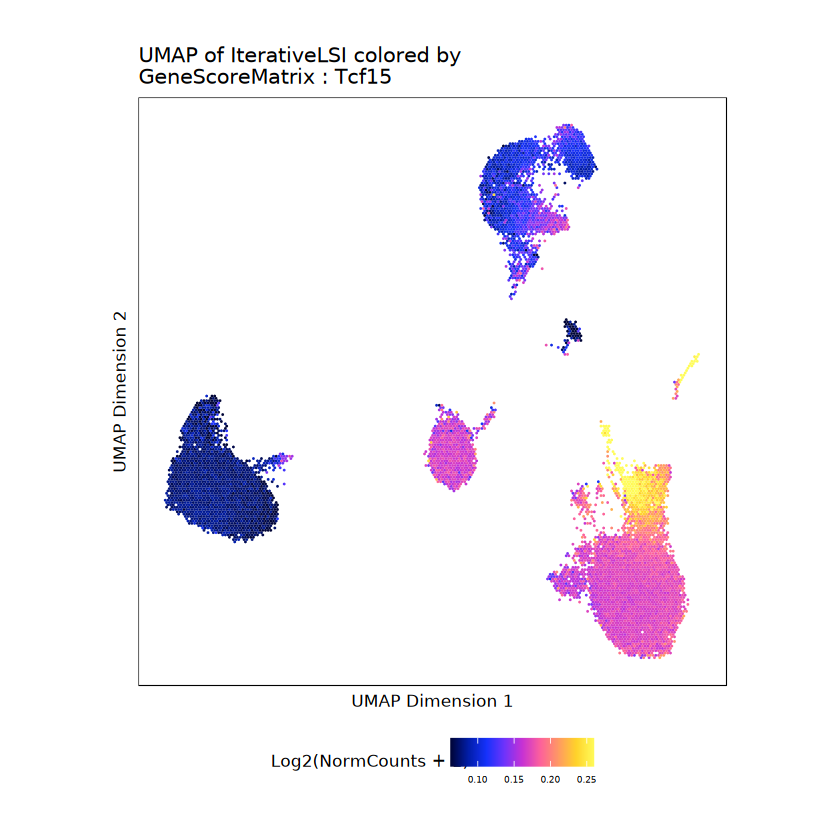

...

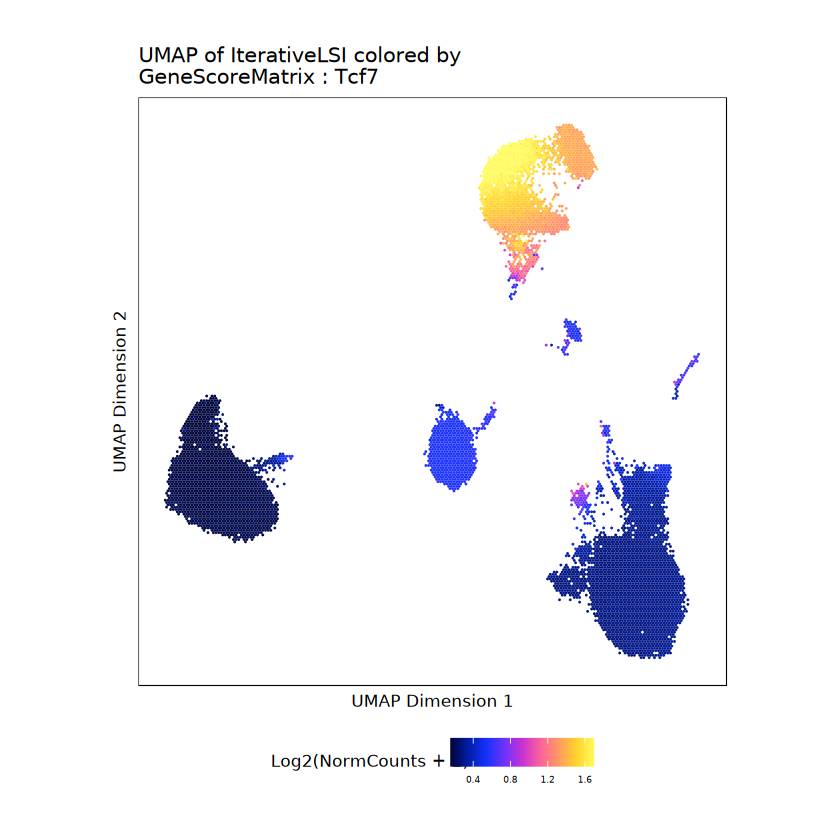

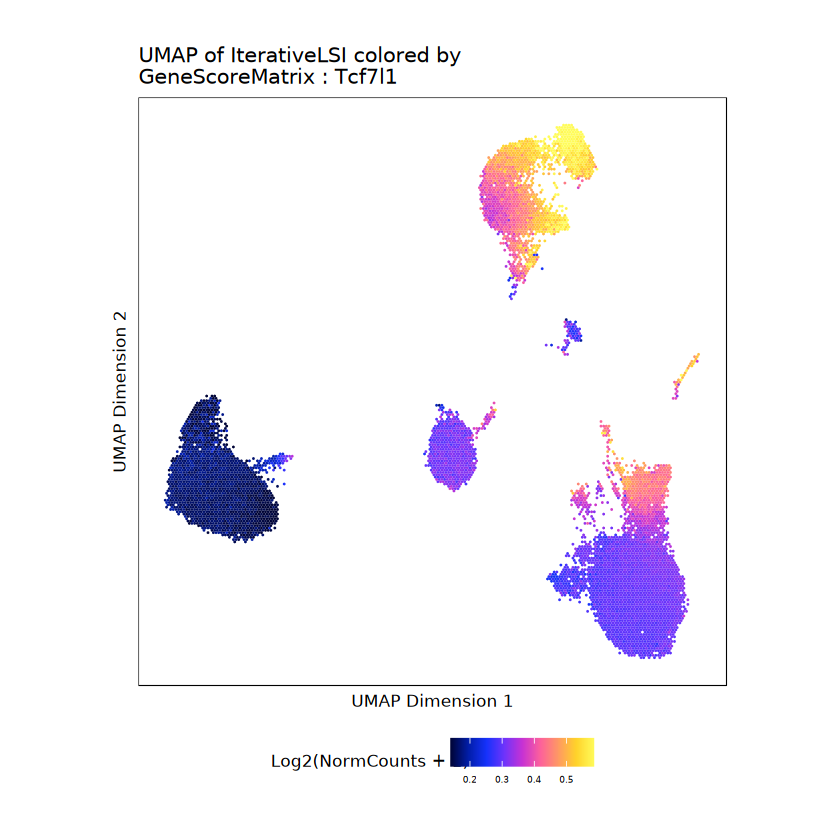

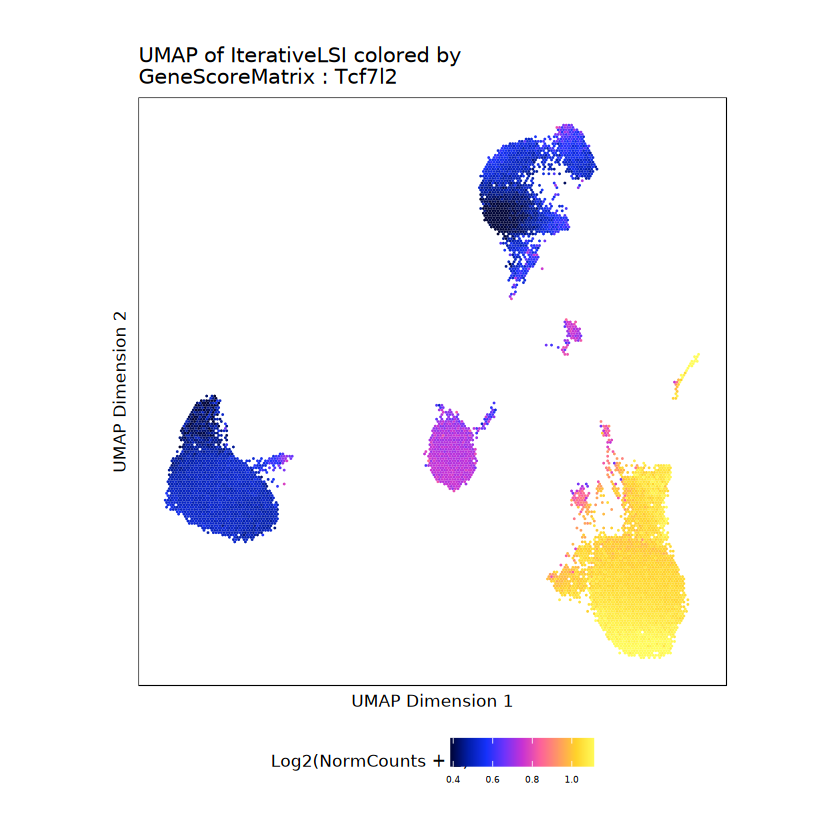

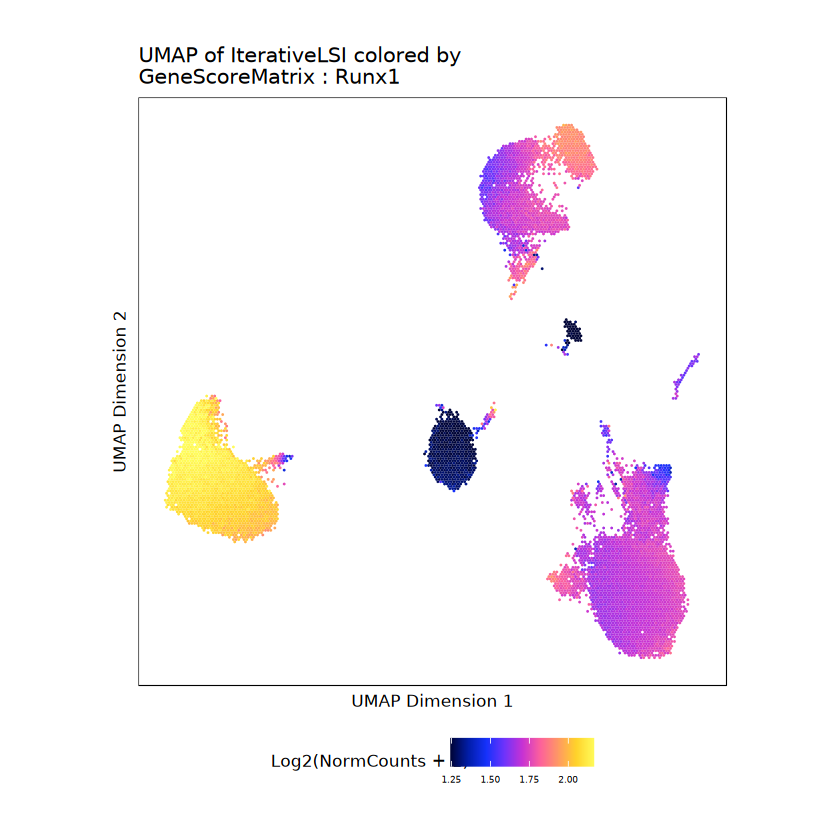

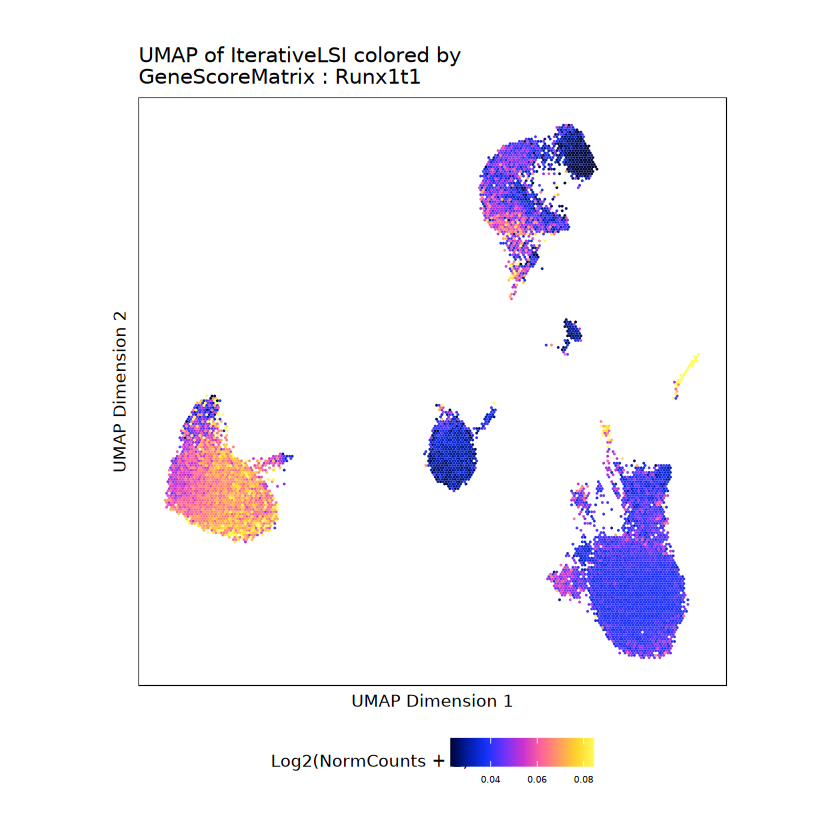

$Ebf1

$Pax5

$Cebpa

$Tcf12

$Tcf15

$Tcf19

$Tcf7

$Tcf7l1

$Tcf7l2

$Runx1

$Runx1t1

$Runx2

$Runx3


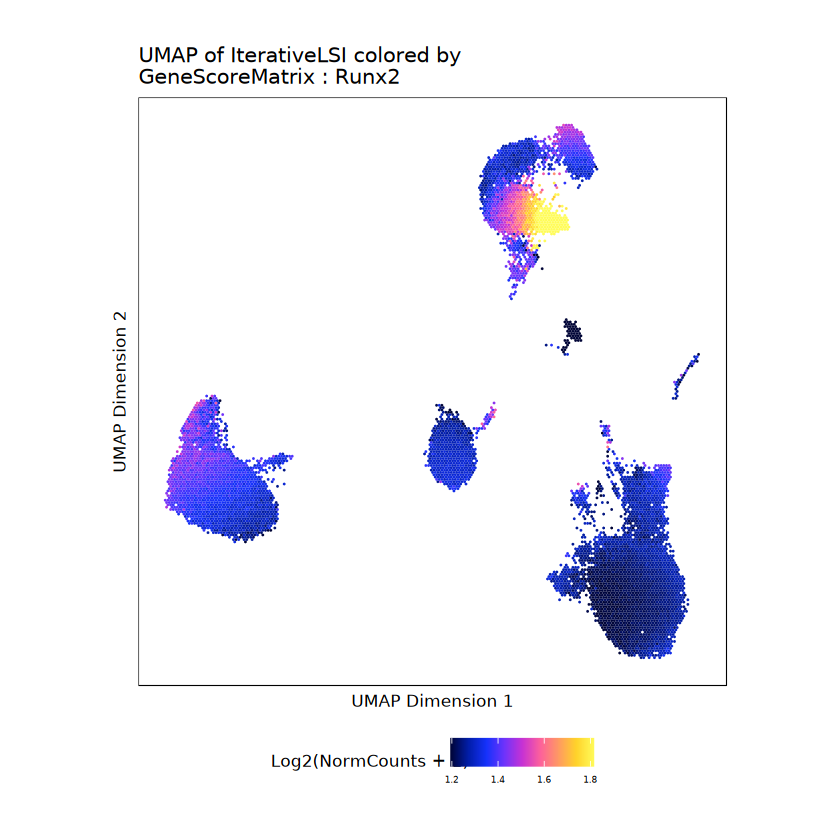

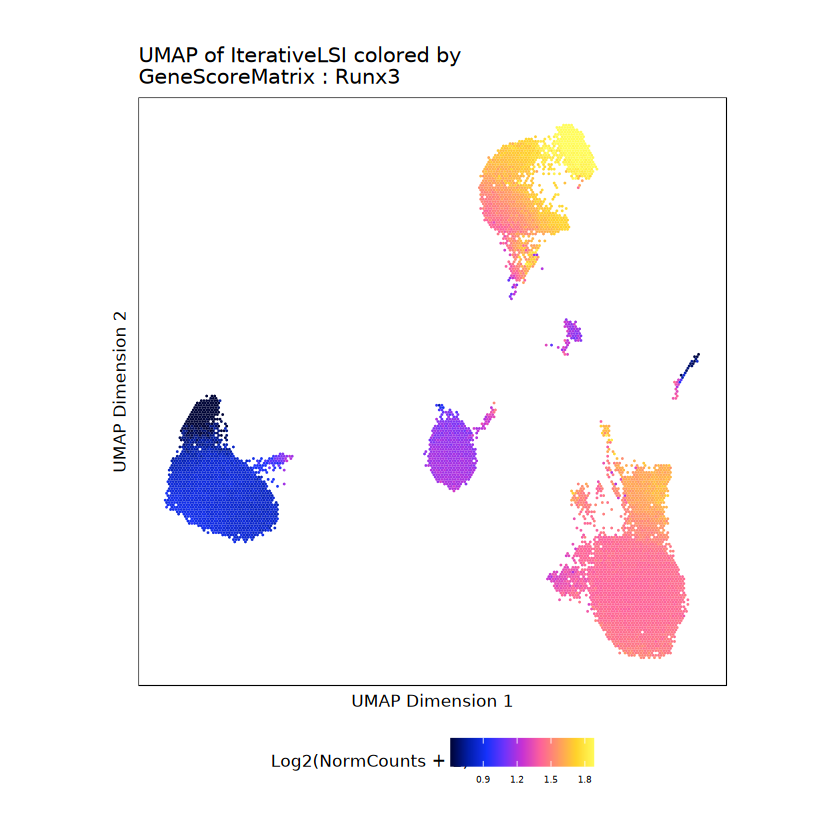

In [75]:
markerRNA <- c('Ebf1','Pax5','Cebpa',
              'Tcf12','Tcf15','Tcf19','Tcf7','Tcf7l1','Tcf7l2',
              'Runx1','Runx1t1','Runx2','Runx3')
p_motif_genes <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerRNA, 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(proj)
)
p_motif_genes

# Wilcoxon

In [5]:
markersGS <- getMarkerFeatures(ArchRProj = proj, useMatrix = "GeneScoreMatrix",
                                groupBy = "Clusters",
                                testMethod = "wilcoxon")

## To get the markers
#markers <- getMarkers(GS.markers, cutOff = "FDR <= 0.01 & Log2FC >= 1.25")
## We can visualize all of the markers in a heatmap and label some of genes of interest
#marker.genes <- sample(unique(unlist(lapply(1:length(markers), function(x){markers[[names(markers)[x]]]$name[1:5]}))), 15)
#heatmap.geneMK <- markerHeatmap(seMarker = GS.markers, cutOff = "FDR <= 0.01 & Log2FC >= 1.25",labelMarkers = marker.genes, transpose = T)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-12bad8722ff4d3-Date-2024-11-19_Time-18-14-37.29407.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2024-11-19 18:14:37.562762 : Matching Known Biases, 0.002 mins elapsed.

2024-11-19 18:14:44.566314 : Computing Pairwise Tests (1 of 16), 0.119 mins elapsed.

Pairwise Test C1 : Seqnames chr1

Pairwise Test C1 : Seqnames chr10

Pairwise Test C1 : Seqnames chr11

Pairwise Test C1 : Seqnames chr12

Pairwise Test C1 : Seqnames chr13

Pairwise Test C1 : Seqnames chr14

Pairwise Test C1 : Seqnames chr15

Pairwise Test C1 : Seqnames chr16

Pairwise Test C1 : Seqnames chr17

Pairwise Test C1 : Seqnames chr18

Pairwise Test C1 : Seqnames chr19

Pairwise Test C1 : Seqnames chr2

Pairwise Test C1 : Seqnames chr3

Pairwise Test C1 : Seqnames chr4

Pairwise Test C1 : Seqnames chr5

Pairwise Test C1 : Seqnames chr6

Pairwise Test C1 : Seqnames chr7

Pairwise Test C1 : Seqnames chr8

Pairwise Test 

Pairwise Test C9 : Seqnames chr13

Pairwise Test C9 : Seqnames chr14

Pairwise Test C9 : Seqnames chr15

Pairwise Test C9 : Seqnames chr16

Pairwise Test C9 : Seqnames chr17

Pairwise Test C9 : Seqnames chr18

Pairwise Test C9 : Seqnames chr19

Pairwise Test C9 : Seqnames chr2

Pairwise Test C9 : Seqnames chr3

Pairwise Test C9 : Seqnames chr4

Pairwise Test C9 : Seqnames chr5

Pairwise Test C9 : Seqnames chr6

Pairwise Test C9 : Seqnames chr7

Pairwise Test C9 : Seqnames chr8

Pairwise Test C9 : Seqnames chr9

Pairwise Test C9 : Seqnames chrX

Pairwise Test C9 : Seqnames chrY

Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
2024-11-19 18:17:07.346248 : Computing Pairwise Tests (10 of 16), 2.499 mins elapsed.

Pairwise Test C10 : Seqnames chr1

Pairwise Test C10 : Seqnames chr10

Pairwise Test C10 : Seqnames chr11

Pairwise Test C10 : Seqnames chr12

Pairwise Test C10 : Seqnames chr

In [6]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.01 & Log2FC >= 1.25")

In [17]:
library(openxlsx)
setwd(current_dir)
wb <- createWorkbook()
for (i in seq_along(markerList)) {
  addWorksheet(wb, sheetName = names(markerList)[i])
  writeData(wb, sheet = i, markerList[[i]])
}

saveWorkbook(wb, file = "01_markerList_allclusters.xlsx", overwrite = TRUE)

In [90]:
top10genespercluster <- data.frame(matrix(NA, nrow = 15, ncol = 0))

for (i in names(markerList)) {
  genenames <- markerList@listData[[i]]@listData[["name"]][1:15]
  workingdf <- data.frame(genenames)
  colnames(workingdf) <- i
  top10genespercluster <- cbind(top10genespercluster, workingdf)
}

write.csv(top10genespercluster, "top10genespercluster.csv", row.names = FALSE)

In [91]:
top10genespercluster

C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,C15,C16
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Tcim,Ankrd33b,Smox,Fgf3,Fer,Dusp3,Apol7d,Gm826,Cadm1,NA,Bcl11b,Adamts14,Bcl11b,Lef1,Ebf1,Ldlrad3
Wwtr1,A530064D06Rik,Ankrd33b,Cd24a,Syne1,Cfap97d1,Pnpla5,Cd83,Ror1,NA,Gm27162,4933432G23Rik,Rora,Tcf7,Pax5,Arhgap32
Hspb8,Gm19510,Csf1,Cebpe,Zfp704,Kctd19,Gata2,Arhgef10l,Fam50b,NA,Ephb6,Galnt2,Lef1,Bcl11b,5730488B01Rik,Siglech
Zfp462,Hcar2,Il1b,Trpm7,Il4,Ambp,Adgre4,Gab1,Zfp366,NA,Jakmip1,Il2rb,Gm15511,Gramd3,Ppp1r16b,Pakap
Ackr3,Dusp1,Eps8l3,NA,Dach1,Plxna4os1,AU022793,Cacna1d,Nectin1,NA,Gm15511,Gzma,Inpp4b,Ablim1,Mir5120,Mctp2
Cdh13,Trem1,Pik3ap1,NA,Meis1,Skint3,Gata1,Ccl2,BC039771,NA,Aff3,Sorcs2,Camk4,Camk4,Ets1,Jakmip1
Dst,Cxcl2,Gm19510,NA,Serpine1,Gphb5,Il4,Cd86,Ank2,NA,Gimap7,Eya2,Atxn1,Galnt2,Ablim1,Mn1
Col18a1,Jund,Il1a,NA,Tesc,Epha4,Nlrp1a,1700108F19Rik,Hrh1,NA,Sh2d2a,Irf8,Gm27162,4930465M20Rik,Tmem163,Zfp521
Cspg4,Zfp36,Entpd1,NA,Zbtb16,Oas1g,Serpina11,4933417E11Rik,Efcc1,NA,Ehd3,Cdh17,Icos,Pakap,Pou2af1,Tcf4


In [82]:
markerGenes  <- c(
    "Cd4","Il7r",
    "Cd8a", "Cd8b1","Ccl5",
    "Ngly1", "Nkg7","Klrb1c",
    "Cd79a",  "Cd79b", "Ms4a1",
    "Fcgr3", "Ms4a7",
    "Lyz1", "Cd14","Lgals3", "S100a8",
    "Cst3",
    "Apoe","Lyz2","PAX5",
    "MEIS1",
    "Krt8","Lmna"
  )

In [22]:
heatmapGS <- markerHeatmap(
  seMarker = markersGS, 
  cutOff = "FDR <= 0.01 & Log2FC >= 1.25", 
  labelMarkers = markerGenes,
  transpose = TRUE
)

Warning message:
“'markerHeatmap' is deprecated.
Use 'plotMarkerHeatmap' instead.
See help("Deprecated")”
ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-3b9d6312833f89-Date-2024-11-19_Time-12-35-04.942539.log
If there is an issue, please report to github with logFile!

Printing Top Marker Genes:

C1:

	Sntg1, Vxn, Gm17644, Stau2, Lincmd1, Mir133b, Gm29669, Pih1d3, Mir6896, Lyg1, Slc9a4, Tmem182, Satb2, BC055402, Mpp4

C2:

	Erbb4, Cdh7, Cdh19, Mir6354, Sdhc, Mpz, Nmbr, Raet1e, H60b, Eya4, Cd164, Fam162b, Ube2g2, Mgat4c, Mir3059

C3:

	Npbwr1, Crispld1, Defb41, Adgrb3, Gm20172, Gm5524, Gm16894, Il1r2, Il18rap, Mir6350, C230029F24Rik, Cxcr1, Sphkap, 1700063A18Rik, Slco6c1

C4:

	Cebpe, Trpm7, Cd24a, Fgf3, Sox17, Rgs20, Npbwr1, Alkal1, Sntg1, 2610203C22Rik, Vxn, Mcmdc2, Prex2, A830018L16Rik, Gm17644

C5:

	Paqr8, Efhc1, Gsta3, Tfcp2l1, Slc45a3, Sox13, Rgs18, Mir7682, Mir6347, Kif26b, Syne1, Adgrg6, Perp, Oit3, Unc5b

C6:

	Skint3, Dusp3, Gphb5, Ambp, Jchain, Oas1g, Plxna4os1, Kctd19

 [1] "Cd4"    "Il7r"   "Cd8a"   "Cd8b1"  "Ccl5"   "Ngly1"  "Nkg7"   "Klrb1c"
 [9] "Cd79a"  "Cd79b"  "Ms4a1"  "Fcgr3"  "Ms4a7"  "Lyz1"   "Cd14"   "Lgals3"
[17] "S100a8" "Cst3"   "Apoe"   "Lyz2"   "MEIS1"  "Krt8"   "Lmna"  


Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-3b9d6312833f89-Date-2024-11-19_Time-12-35-04.942539.log



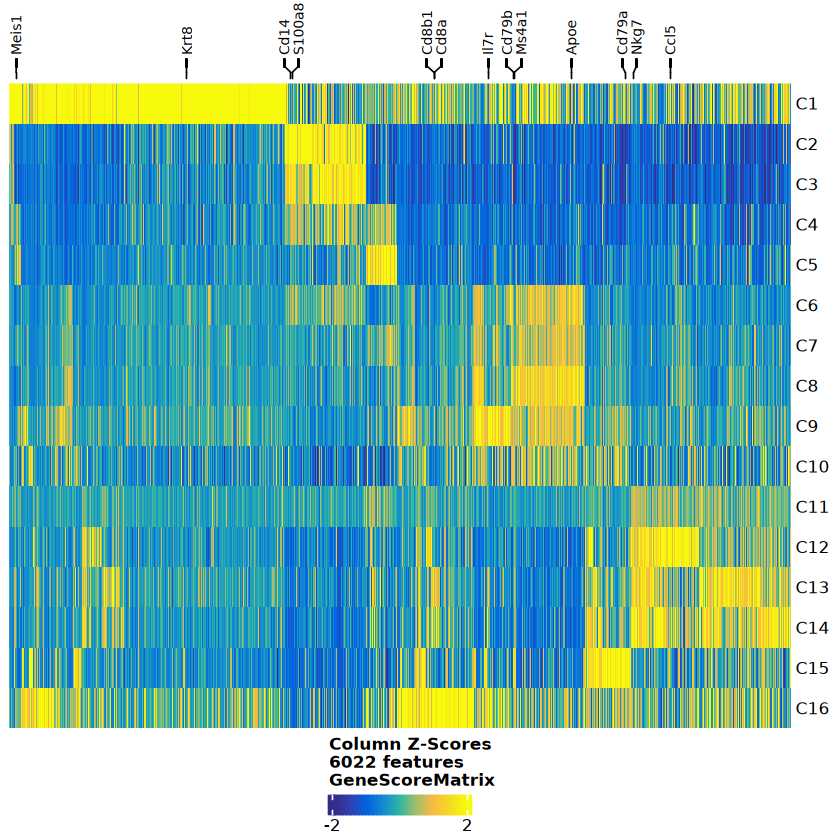

In [84]:
ComplexHeatmap::draw(heatmapGS, heatmap_legend_side = "bot",
                     annotation_legend_side = "bot")

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3b9d634eff4ca8-Date-2024-11-19_Time-13-20-53.004455.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2024-11-19 13:20:54.06713 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3b9d634eff4ca8-Date-2024-11-19_Time-13-20-53.004455.log



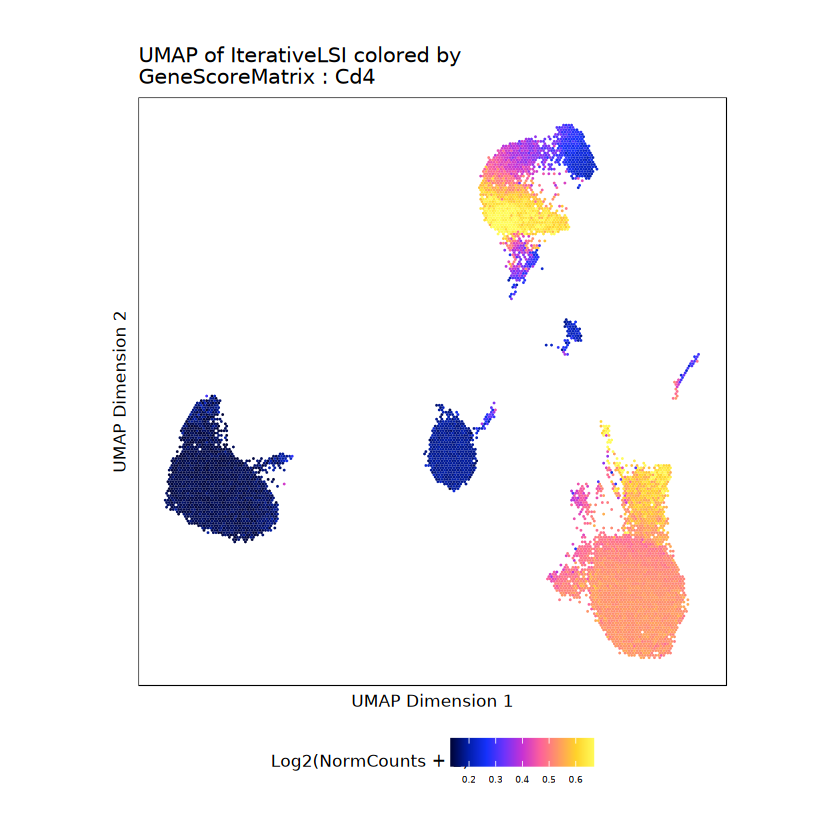

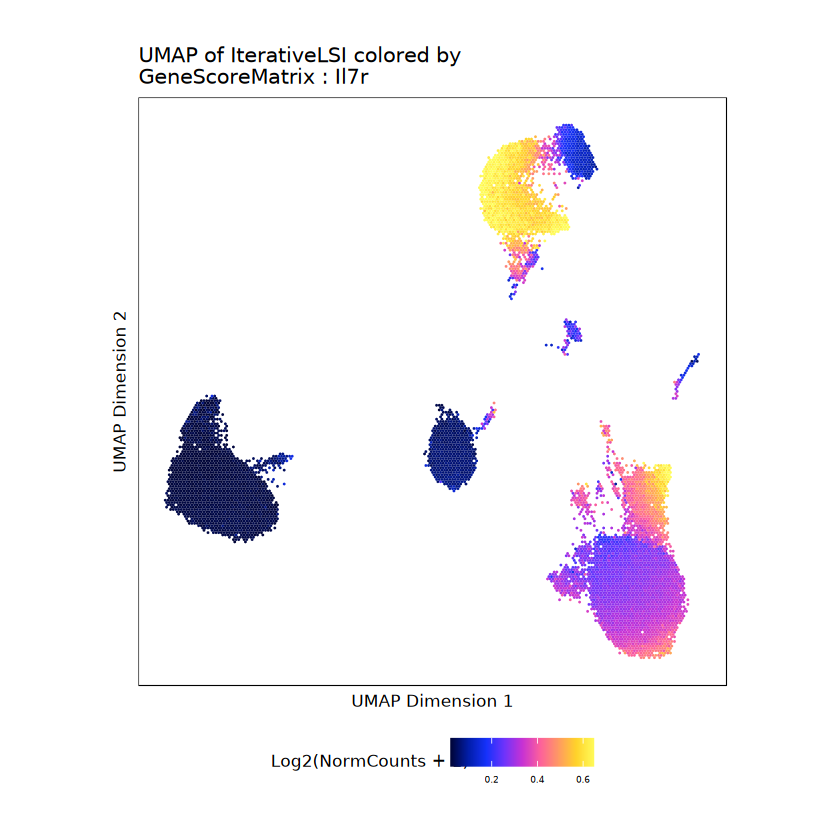

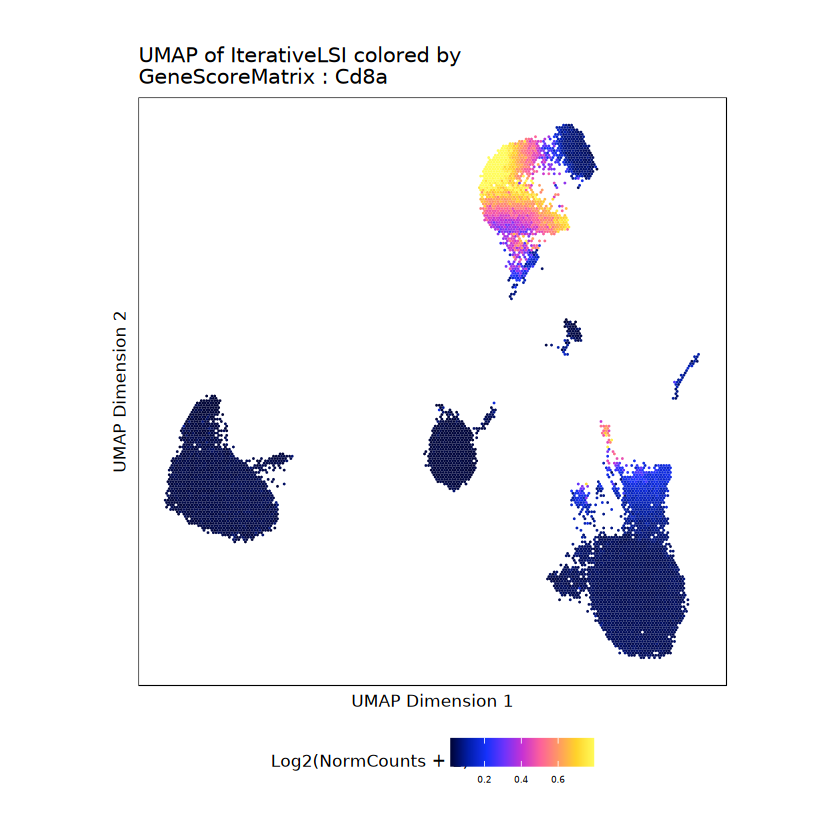

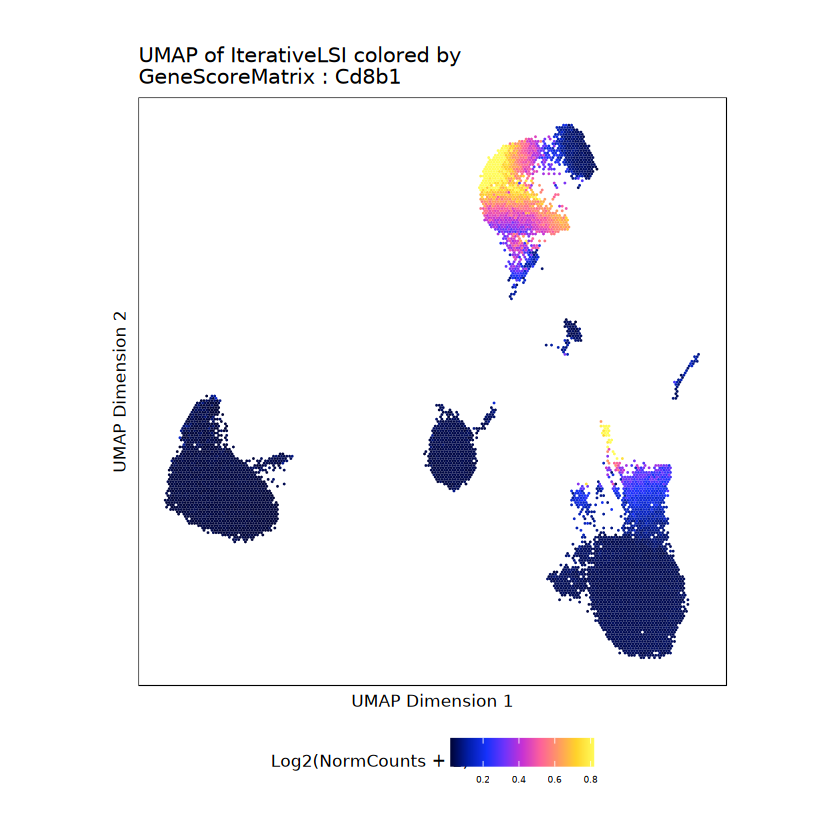

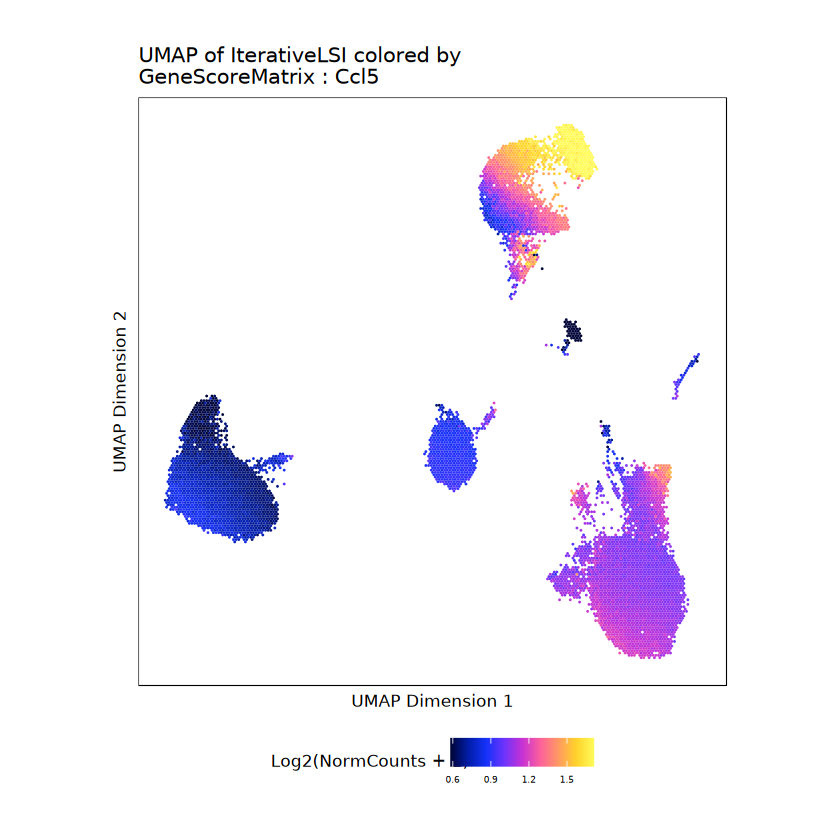

...

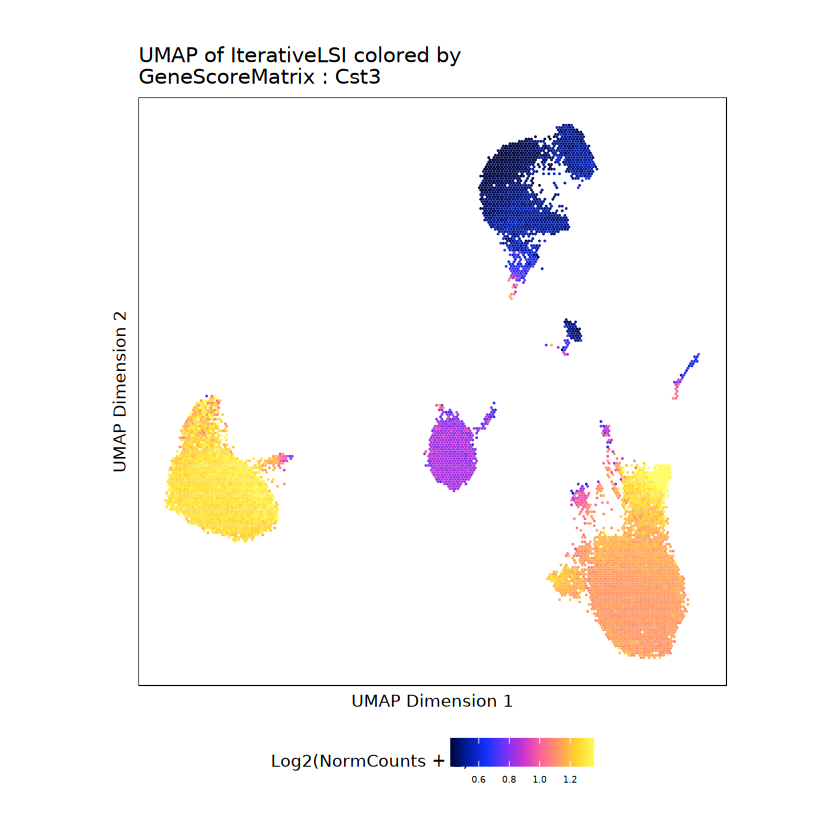

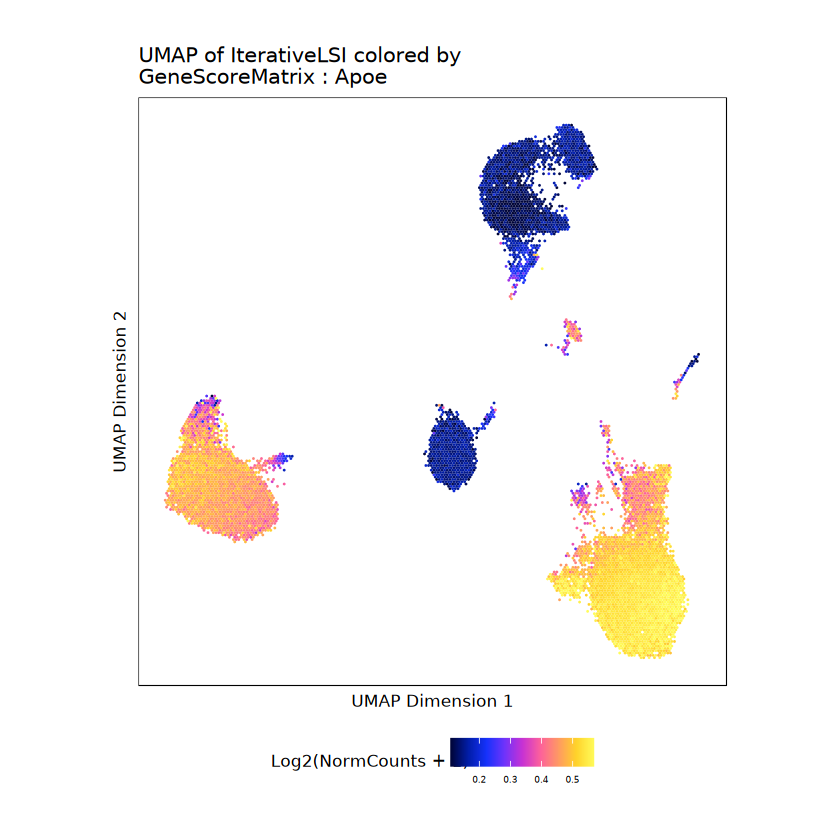

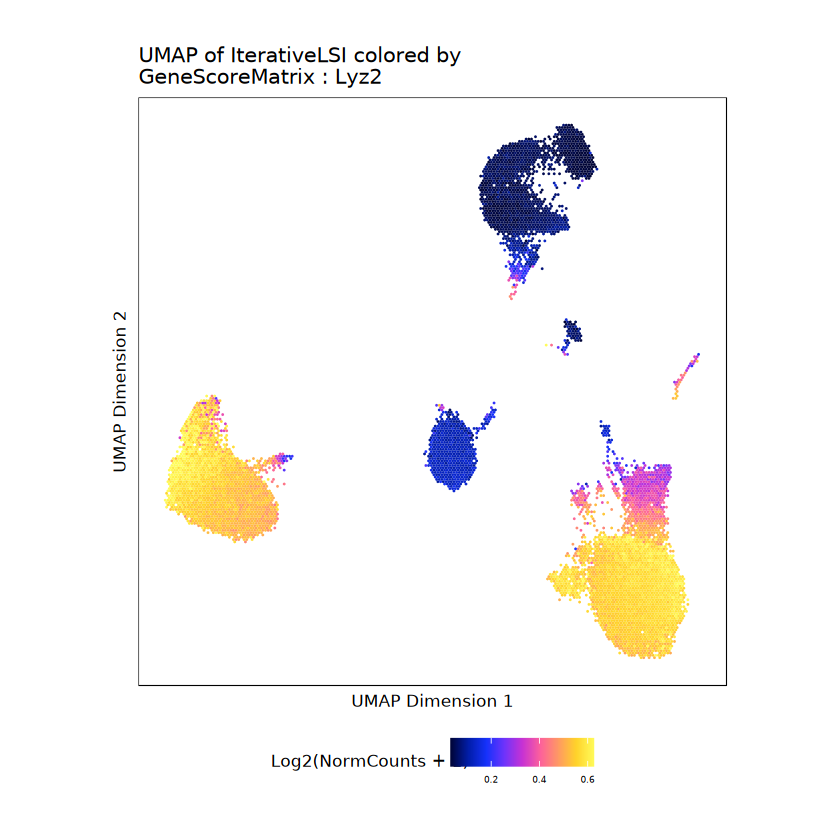

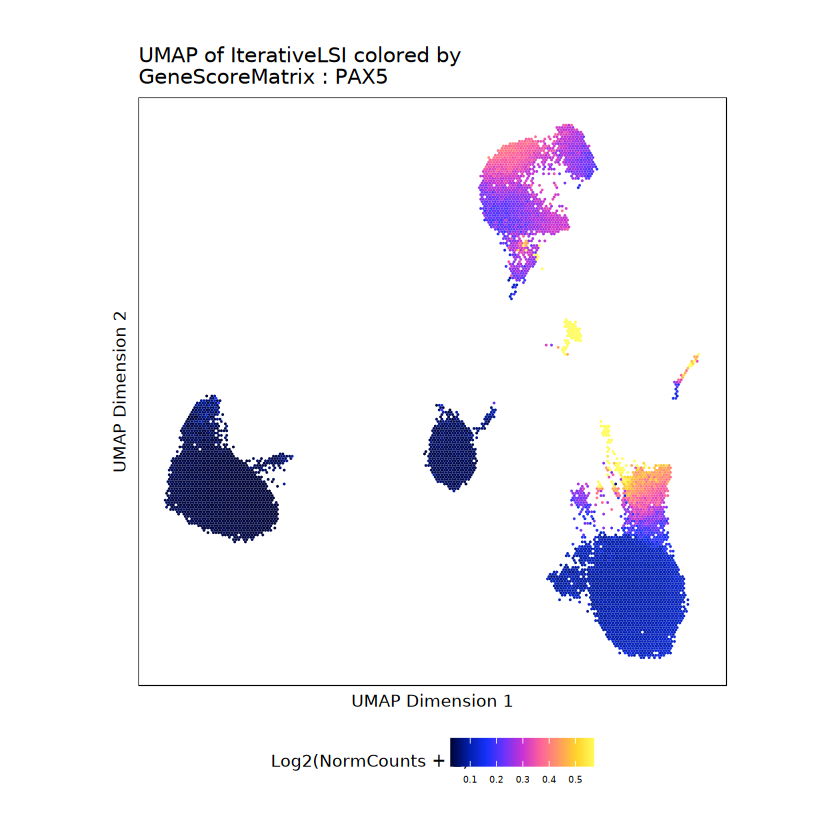

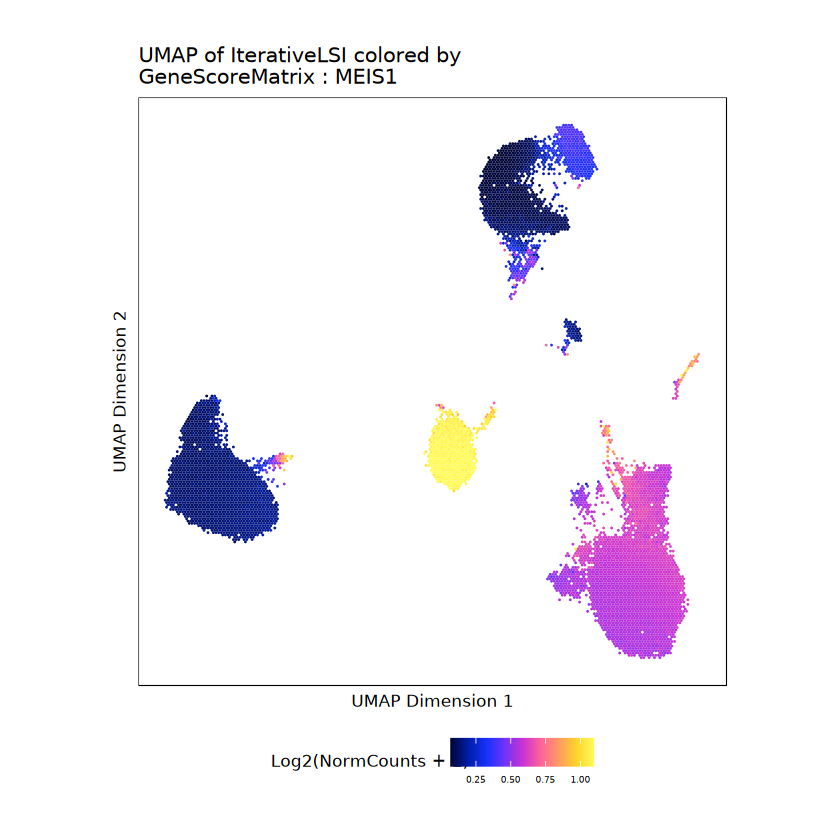

$Cd4

$Il7r

$Cd8a

$Cd8b1

$Ccl5

$Ngly1

$Nkg7

$Klrb1c

$Cd79a

$Cd79b

$Ms4a1

$Fcgr3

$Ms4a7

$Lyz1

$Cd14

$Lgals3

$S100a8

$Cst3

$Apoe

$Lyz2

$PAX5

$MEIS1

$Krt8

$Lmna


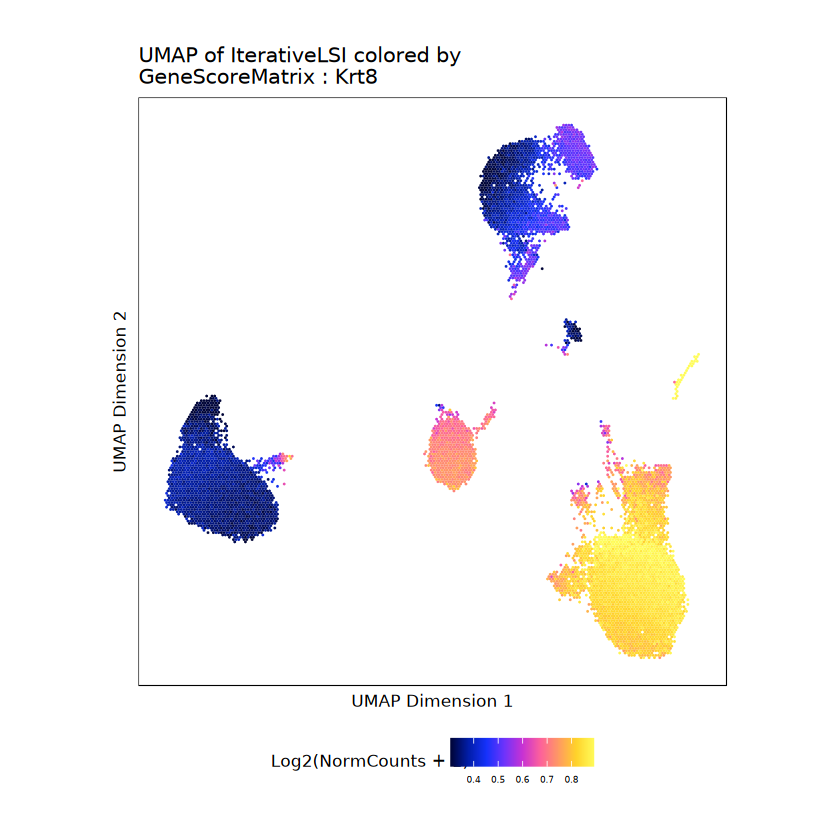

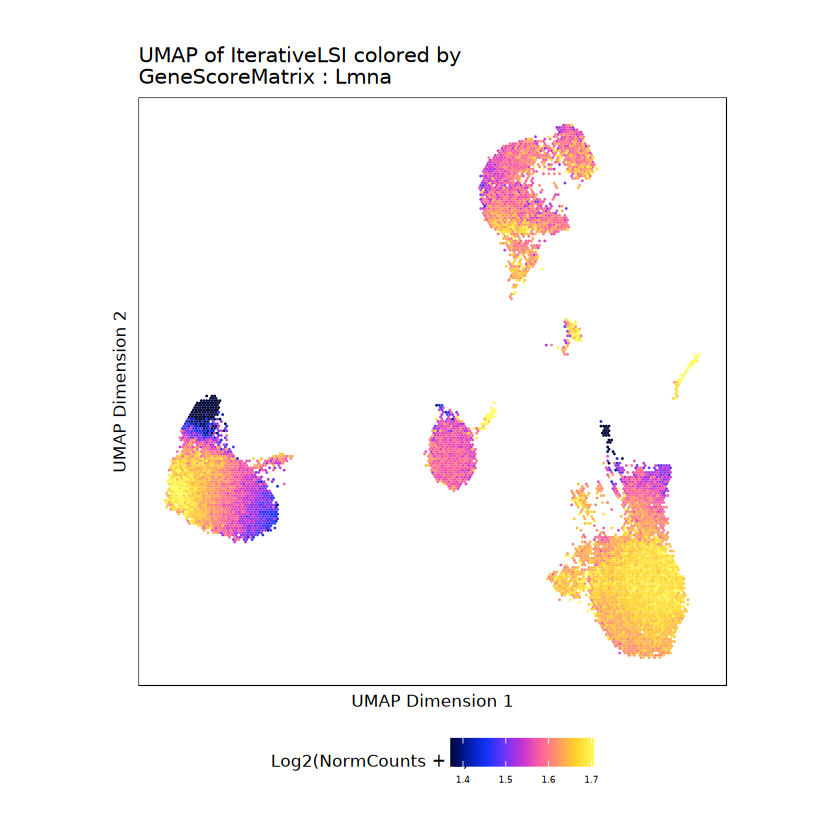

In [83]:
p_genes <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(proj)
)
p_genes

In [78]:
u1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = c("Sample","Clusters","filteration_status"), embedding = "UMAP")
u2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", 
                    name = c("TSSEnrichment","nFrags","BlacklistRatio","ReadsInPeaks",
                             "PromoterRatio","DoubletScore","DoubletEnrichment"), 
                    embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3b9d632fe62231-Date-2024-11-19_Time-13-15-34.898927.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3b9d632fe62231-Date-2024-11-19_Time-13-15-34.898927.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3b9d63495c7442-Date-2024-11-19_Time-13-15-35.54268.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3b9d63495c7442-Date-2024-11-19_Time-13-15-35.54268.log



sub_proj <- loadArchRProject(file.path(Archr_Dir,'manually_filtered2'))
#proj <- addDoubletScores(input = proj, k = 10, knnMethod = "UMAP", LSIMethod = 1)
archr_metadata2 <- getCellColData(sub_proj)
sub_proj

# Save PDF

In [86]:
length(p_genes)

[1] 24

In [92]:
setwd(current_dir)
pdf("05_cellannotation_Bladder.pdf", width = 16, height = 15)
#pdf("merged_archr_qcmetrics_Bladder.pdf", width = 15, height = 15)
grid.table(top10genespercluster, theme = ttheme_minimal(base_size = 10))
grid.arrange(do.call(gridExtra::arrangeGrob, c(u1, ncol = 3)))
grid.arrange(do.call(gridExtra::arrangeGrob, c(u2, ncol = 3)))
#grid.arrange(c1, c2, c3, ncol = 2)
#grid.arrange(p1, p2, p3, p4, p5, p6, ncol = 2)
grid.arrange(do.call(gridExtra::arrangeGrob, c(p_motifs_3[1:6], ncol = 3)))
grid.arrange(do.call(gridExtra::arrangeGrob, c(p_motifs_3[7:12], ncol = 3)))
grid.arrange(do.call(gridExtra::arrangeGrob, c(p_motifs[1:6], ncol = 3)))
grid.arrange(do.call(gridExtra::arrangeGrob, c(p_motifs[7:12], ncol = 3)))
grid.arrange(do.call(gridExtra::arrangeGrob, c(p_motif_genes[1:6], ncol = 3)))
grid.arrange(do.call(gridExtra::arrangeGrob, c(p_motif_genes[7:12], ncol = 3)))
grid.arrange(do.call(gridExtra::arrangeGrob, c(p_genes[1:12], ncol = 4)))
grid.arrange(do.call(gridExtra::arrangeGrob, c(p_genes[13:24], ncol = 4)))
#ComplexHeatmap::draw(heatmapGS, heatmap_legend_side = "bot",annotation_legend_side = "bot")
dev.off()

Picking joint bandwidth of 0.0407

Picking joint bandwidth of 0.0207

Picking joint bandwidth of 0.0345

Picking joint bandwidth of 0.0574

Picking joint bandwidth of 0.107

Picking joint bandwidth of 0.029

Picking joint bandwidth of 0.0494

Picking joint bandwidth of 0.0487

Picking joint bandwidth of 0.054

Picking joint bandwidth of 0.0945

Picking joint bandwidth of 0.0827

Picking joint bandwidth of 0.0945



pdf 
  2

# Additional data

In [ ]:
m <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "MotifMatrix", 
    name = c(), 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(proj)
)
m

In [10]:
proj <- addImputeWeights(proj)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-15c0db422691bf-Date-2024-11-20_Time-14-51-46.049804.log
If there is an issue, please report to github with logFile!

2024-11-20 14:51:46.099379 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-15c0db2036104f-Date-2024-11-20_Time-14-52-55.826407.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2024-11-20 14:52:55.939573 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Using weights on disk

1 of 8

2 of 8

3 of 8

4 of 8

5 of 8

6 of 8

7 of 8

8 of 8

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-15c0db2036104f-Date-2024-11-20_Time-14-52-55.826407.log



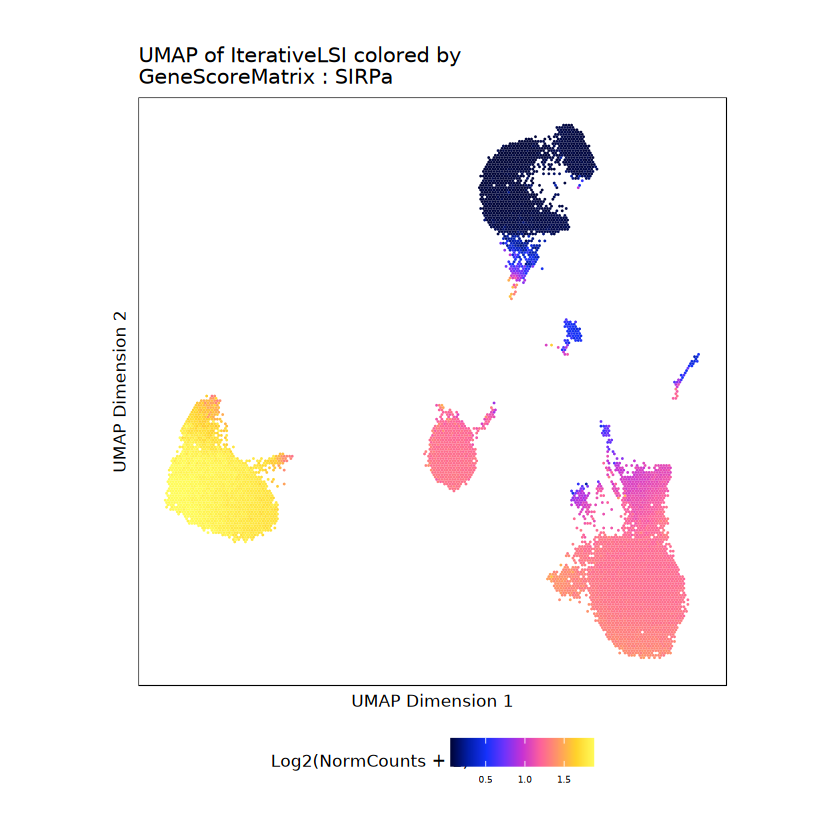

In [13]:
g <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = "SIRPa", 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(proj)
    )
g

# Final Annotations 1

In [118]:
# Create a named vector for the cluster annotations
cell_annotations <- c(
  "C2" = "Neutrophils",   # Map C2 to Neutrophils
  "C3" = "Neutrophils",   # Map C3 to Neutrophils
  "C5" = "General Myeloid Cells",
  "C8" = "Monocytes/Macrophages",
  "C9" = "DC",
  "C13" = "CD4T",
  "C14" = "CD8T",
  "C12" = "NK",
  "C1" = "B",
  "C15" = "B",
  "C4" = "Doublets",
  "C6" = "Doublets",
  "C7" = "Doublets",
  "C10" = "Doublets",
  "C11" = "Doublets",
  "C16" = "Doublets"
)


In [119]:
library(dplyr)
metadata <- as.data.frame(archr_metadata) 
metadata <- metadata %>%
  mutate(
    Cell_Annotation1 = recode(Clusters, !!!cell_annotations),  # Map clusters to annotations
    Cell_Annotation1 = ifelse(is.na(Cell_Annotation1), "Doublets", Cell_Annotation1)  # Assign "Doublets" if NA
  )
unique(metadata$Cell_Annotation1)
head(metadata)

[1] "B"                     "Doublets"              "DC"                   
[4] "CD4T"                  "Monocytes/Macrophages" "Neutrophils"          
[7] "NK"                    "CD8T"                  "General Myeloid Cells"

,Sample,TSSEnrichment,ReadsInTSS,ReadsInPromoter,ReadsInBlacklist,PromoterRatio,PassQC,NucleosomeRatio,nMultiFrags,nMonoFrags,⋯,DoubletScore,DoubletEnrichment,predictedCell_Un,predictedGroup_Un,predictedScore_Un,predictedCell,predictedGroup,predictedScore,filteration_status,Cell_Annotation1
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>
MAZ5#GTTTACTAGGAACAAG-1,MAZ5,17.762,3857,14124,1322,0.2418907,1,0.6867922,1298,17308,⋯,0.000000,0.06666667,ATAAGAGTCAAACGGG-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9968700,GGCAATTGTATTCTCT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,1.0000000,present,B
MAZ5#AGGGTTTAGCTATATC-1,MAZ5,17.414,3887,14035,1395,0.2515864,1,0.6906898,1171,16498,⋯,0.000000,0.40000000,CAGCATAAGGCGATAC-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9586221,TTTACTGGTACAGACG-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9941577,present,B
MAZ5#TGGTGAGTCTGTGATT-1,MAZ5,17.899,3715,13359,1159,0.2427232,1,0.6106169,1159,17086,⋯,3.670142,1.91111111,AACTGGTAGCGCTTAT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,0.9977114,GGCAATTGTATTCTCT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,1.0000000,present,B
MAZ5#TGAGCAAGTAATGGTG-1,MAZ5,21.500,5179,17422,1435,0.3195759,1,0.6959930,1280,16072,⋯,13.097879,2.51111111,GCAGTTAGTAAGGATT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Monocytes,0.8490124,GAACCTAGTGTGCCTG-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Monocytes,0.8467838,present,Doublets
MAZ5#GCGAAACGTACCGGCT-1,MAZ5,20.747,4369,15014,997,0.2755773,1,0.4239193,972,19131,⋯,0.000000,0.02222222,TACTTGTAGGCTATCT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,0.9968936,GGCAATTGTATTCTCT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,1.0000000,present,B
MAZ5#ATTGCGGAGGAACCTG-1,MAZ5,19.613,4259,14966,1059,0.2748880,1,0.4614270,983,18627,⋯,10.366655,2.35555556,ACGGGCTTCCCAACGG-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9967382,GAACGGACACCATCCT-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9941879,present,B


In [120]:
proj$Cell_Annotation1 <- metadata$Cell_Annotation1
getCellColData(proj)
proj <- saveArchRProject(proj)

DataFrame with 39160 rows and 26 columns
                             Sample TSSEnrichment ReadsInTSS ReadsInPromoter
                        <character>     <numeric>  <numeric>       <numeric>
MAZ5#GTTTACTAGGAACAAG-1        MAZ5        17.762       3857           14124
MAZ5#AGGGTTTAGCTATATC-1        MAZ5        17.414       3887           14035
MAZ5#TGGTGAGTCTGTGATT-1        MAZ5        17.899       3715           13359
MAZ5#TGAGCAAGTAATGGTG-1        MAZ5        21.500       5179           17422
MAZ5#GCGAAACGTACCGGCT-1        MAZ5        20.747       4369           15014
...                             ...           ...        ...             ...
MAZ8#AGATAAGCAACGTGGT-1        MAZ8         7.228         73             235
MAZ8#GCCTATATCCAGGACA-1        MAZ8         5.050         51             207
MAZ8#TAAACCCGTAGTTACC-1        MAZ8         5.842         59             185
MAZ8#CATCACTCATGAGGGA-1        MAZ8         7.723         78             220
MAZ8#TATGTCCCAACATAGT-1        MAZ8

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3cd85358f63860-Date-2024-11-19_Time-16-04-32.70419.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3cd85358f63860-Date-2024-11-19_Time-16-04-32.70419.log



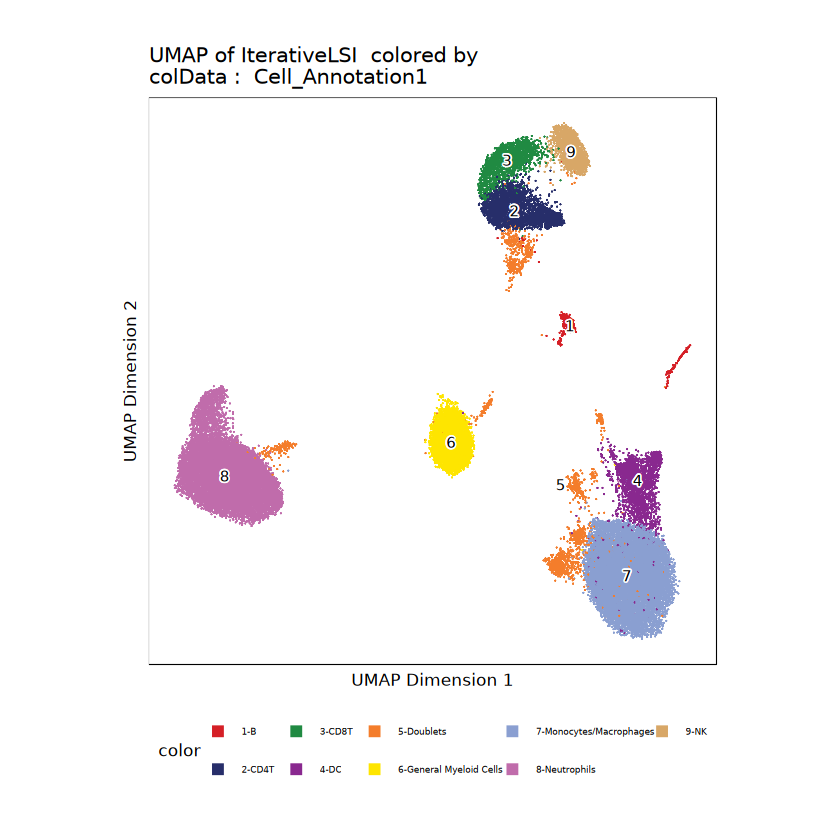

In [41]:
setwd(current_dir)
u3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Cell_Annotation1", embedding = "UMAP")
ggsave("temp.pdf", plot = u3, width = 7, height = 7)
u3

In [42]:
ggsave("temp.pdf", plot = u3, width = 7, height = 7)

# Save treatments

In [24]:
treatments <- c(
  "MAZ5" = "PBS",
  "MAZ6" = "BG-pre",
  "MAZ7" = "BG-post",
  "MAZ8" = "BG-BCG"
)

In [25]:
library(dplyr)
metadata <- as.data.frame(archr_metadata) 
metadata <- metadata %>%
  mutate(
    Sample2 = recode(Sample, !!!treatments)
  )
unique(metadata$Sample2)
head(metadata)

[1] "PBS"     "BG-pre"  "BG-post" "BG-BCG"

,Sample,TSSEnrichment,ReadsInTSS,ReadsInPromoter,ReadsInBlacklist,PromoterRatio,PassQC,NucleosomeRatio,nMultiFrags,nMonoFrags,⋯,predictedCell_Un,predictedGroup_Un,predictedScore_Un,predictedCell,predictedGroup,predictedScore,filteration_status,Cell_Annotation1,Treatment,Sample2
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
MAZ5#GTTTACTAGGAACAAG-1,MAZ5,17.762,3857,14124,1322,0.2418907,1,0.6867922,1298,17308,⋯,ATAAGAGTCAAACGGG-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9968700,GGCAATTGTATTCTCT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,1.0000000,present,B,PBS,PBS
MAZ5#AGGGTTTAGCTATATC-1,MAZ5,17.414,3887,14035,1395,0.2515864,1,0.6906898,1171,16498,⋯,CAGCATAAGGCGATAC-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9586221,TTTACTGGTACAGACG-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9941577,present,B,PBS,PBS
MAZ5#TGGTGAGTCTGTGATT-1,MAZ5,17.899,3715,13359,1159,0.2427232,1,0.6106169,1159,17086,⋯,AACTGGTAGCGCTTAT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,0.9977114,GGCAATTGTATTCTCT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,1.0000000,present,B,PBS,PBS
MAZ5#GCGAAACGTACCGGCT-1,MAZ5,20.747,4369,15014,997,0.2755773,1,0.4239193,972,19131,⋯,TACTTGTAGGCTATCT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,0.9968936,GGCAATTGTATTCTCT-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,1.0000000,present,B,PBS,PBS
MAZ5#ATTGCGGAGGAACCTG-1,MAZ5,19.613,4259,14966,1059,0.2748880,1,0.4614270,983,18627,⋯,ACGGGCTTCCCAACGG-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9967382,GAACGGACACCATCCT-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9941879,present,B,PBS,PBS
MAZ5#GTCTTTGAGTGCTCCG-1,MAZ5,16.941,3713,13327,1079,0.2473001,1,0.6122180,1124,16713,⋯,CATGGCGAGCTGCCCA-1#Sample_Wt_BCG_BL_IGO_15872_1__count,Tumor,0.9652993,CAGCATAAGGCGATAC-1#Sample_Wt_PBS_BL_IGO_15872_2__count,Tumor,0.9809241,removed,B,PBS,PBS


In [26]:
proj$Sample2 <- metadata$Sample2

In [27]:
proj <- saveArchRProject(proj)
proj

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/merged_ArchR_Bladder/manually_filtered2 
samples(4): MAZ6 MAZ5 MAZ7 MAZ8
sampleColData names(1): ArrowFiles
cellColData names(28): Sample TSSEnrichment ... Treatment Sample2
numberOfCells(1): 37276
medianTSS(1): 24.4875
medianFrags(1): 3914

In [28]:
out_dir <- "/athena/josefowiczlab/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/merged_ArchR_Bladder/manually_filtered2/export"
write.csv(metadata, file = file.path(out_dir,"archr_metadata.csv"), row.names = TRUE)

# Save Gene score matrix

In [5]:
gene_matrix <- getMatrixFromProject(
  ArchRProj = proj,
  useMatrix = "GeneScoreMatrix",
)
head(gene_matrix)

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-1556f820385c94-Date-2024-11-20_Time-13-19-56.892143.log
If there is an issue, please report to github with logFile!

2024-11-20 13:20:40.932364 : Organizing colData, 0.734 mins elapsed.

2024-11-20 13:20:41.012415 : Organizing rowData, 0.735 mins elapsed.

2024-11-20 13:20:41.015461 : Organizing rowRanges, 0.735 mins elapsed.

2024-11-20 13:20:41.019454 : Organizing Assays (1 of 1), 0.735 mins elapsed.

2024-11-20 13:20:43.295107 : Constructing SummarizedExperiment, 0.773 mins elapsed.

2024-11-20 13:20:43.766111 : Finished Matrix Creation, 0.781 mins elapsed.



class: SummarizedExperiment 
dim: 6 39160 
metadata(0):
assays(1): GeneScoreMatrix
rownames: NULL
rowData names(6): seqnames start ... name idx
colnames(39160): MAZ6#ATACTGTTCCTTCATC-1 MAZ6#AGAAAGCCACATTGTC-1 ...
  MAZ8#CATCACTCATGAGGGA-1 MAZ8#TATGTCCCAACATAGT-1
colData names(27): BlacklistRatio DoubletEnrichment ...
  Cell_Annotation1 Treatment

In [6]:
dense_matrix <- as.matrix(assays(gene_matrix)[["GeneScoreMatrix"]])
gene_scores <- as.data.frame(dense_matrix)
gene_names <- rowData(gene_matrix)$name
rownames(gene_scores) <- gene_names
dim(gene_scores)
head(gene_scores)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 7.1 GiB”


[1] 24367 39160

,MAZ6#ATACTGTTCCTTCATC-1,MAZ6#AGAAAGCCACATTGTC-1,MAZ6#CGTCCATAGAAGCTAC-1,MAZ6#CTATTGAGTCCTGAGC-1,MAZ6#CGGTTTATCCAAGTGG-1,MAZ6#CCTGAATGTGATGCAA-1,MAZ6#ATCATGCGTTAGCTCG-1,MAZ6#CAGGTATAGTTACTAC-1,MAZ6#CACAGGATCGCTCAGT-1,MAZ6#TTAGGTTTCGGCTATC-1,⋯,MAZ8#ATCAGGCCAAATACGT-1,MAZ8#CTAAACCGTTGTTCTT-1,MAZ8#CGTTATAGTGATGAAT-1,MAZ8#CAGGCAATCAGGACCA-1,MAZ8#ACGGATAGTGAACCGG-1,MAZ8#AGATAAGCAACGTGGT-1,MAZ8#GCCTATATCCAGGACA-1,MAZ8#TAAACCCGTAGTTACC-1,MAZ8#CATCACTCATGAGGGA-1,MAZ8#TATGTCCCAACATAGT-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Xkr4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0,0,0,0,0,0,0,0,0,0
Rp1,0.000,0.317,0.000,0.000,0.331,0.000,0.000,0.350,0.000,0.000,⋯,0,0,0,0,0,0,0,0,0,0
Sox17,0.000,0.000,0.198,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0,0,0,0,0,0,0,0,0,0
Mrpl15,0.325,0.000,1.144,0.622,0.577,0.000,0.000,0.000,1.104,0.597,⋯,0,0,0,0,0,0,0,0,0,0
Lypla1,0.378,0.398,0.388,0.000,0.000,0.000,0.000,0.000,0.000,0.406,⋯,0,0,0,0,0,0,0,0,0,0
Tcea1,0.000,0.394,0.000,0.000,0.411,0.437,1.241,0.435,0.421,0.000,⋯,0,0,0,0,0,0,0,0,0,0


In [52]:
gene_names <- rowData(gene_matrix)$name
head(gene_names)

[1] "Xkr4"   "Rp1"    "Sox17"  "Mrpl15" "Lypla1" "Tcea1"

In [9]:
out_dir <- "/athena/josefowiczlab/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/merged_ArchR_Bladder/manually_filtered2/export"
write.csv(gene_scores, file = file.path(out_dir,"gene_scores.csv"), row.names = TRUE)

# Make subset of projects

In [15]:
for (i in unique(proj$Cell_Annotation1)) {
  print(i)
}

[1] "B"
[1] "DC"
[1] "CD4T"
[1] "Monocytes/Macrophages"
[1] "Neutrophils"
[1] "NK"
[1] "CD8T"
[1] "General Myeloid Cells"


In [14]:
cell_types_without_neutrophils <- unique(proj$Cell_Annotation1[!proj$Cell_Annotation1 %in% "Neutrophils"])
cell_types_without_neutrophils

[1] "B"                     "DC"                    "CD4T"                 
[4] "Monocytes/Macrophages" "NK"                    "CD8T"                 
[7] "General Myeloid Cells"

In [20]:
for (celltype in cell_types_without_neutrophils) {
    print(celltype)
    idxSample <- BiocGenerics::which(proj$Cell_Annotation1 %in% celltype)
    cellsSample <- proj$cellNames[idxSample]
    sub_proj <- proj[cellsSample, ]
    if (celltype == "Monocytes/Macrophages") {
        celltype <- "Monocytes_Macrophages"}
    sub_proj <- subsetArchRProject(ArchRProj = proj,cells = getCellNames(sub_proj),outputDirectory = celltype,dropCells = TRUE,force = TRUE)
    proj <- saveArchRProject(ArchRProj = proj)
}

[1] "B"


Copying ArchRProject to new outputDirectory : /athena/cayuga_0039/scratch/rer4011/projects/MAZ_andrew_data/intermediate_results/merged_ArchR_Bladder/B

Copying Arrow Files...

.copyArrow : Initializing Out ArrowFile

.copyArrow : Adding Metadata to Out ArrowFile

.copyArrow : Adding SubMatrices to Out ArrowFile

.copyArrow : Initializing Out ArrowFile

.copyArrow : Adding Metadata to Out ArrowFile

.copyArrow : Adding SubMatrices to Out ArrowFile

.copyArrow : Initializing Out ArrowFile

.copyArrow : Adding Metadata to Out ArrowFile

.copyArrow : Adding SubMatrices to Out ArrowFile

.copyArrow : Initializing Out ArrowFile

.copyArrow : Adding Metadata to Out ArrowFile

.copyArrow : Adding SubMatrices to Out ArrowFile

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 13): Annotations

Copying Other Files (2 of 13): Background-Peaks.rds

Copying Other Files (3 of 13): Embeddings

Copying Other Files (4 of 13): export

Copyin

ERROR: Error in saveArchRProject(ArchRProj = proj, force = TRUE): unused argument (force = TRUE)


# Neutrophil plots

In [25]:
T3_TFs <- c('Mafk','Atf3','Creb5','Fos','Junb','Nfe2l2','Sap30','Ddit3','Atf4','Bhlhe41','Usf2','Atf5',
            'Hif1a','Zmiz1','Jun','Tgif1','Maff','Bhlhe40','Rest','Egr1','Nfil3','Atf1','Cebpb','Fosb','Runx1')

In [26]:
markerMotifs <- getFeatures(proj, select = paste(T3_TFs, collapse="|"), useMatrix = "MotifMatrix")
markerMotifs <- sort(grep("z:", markerMotifs, value = TRUE))
markerMotifs

[1] "z:Atf1_106"   "z:Atf3_110"   "z:Atf4_121"   "z:Atf5_791"   "z:Batf3_789" 
 [6] "z:Bhlhe40_55" "z:Bhlhe41_56" "z:Cebpb_130"  "z:Ddit3_788"  "z:Egr1_190"  
[11] "z:Fos_104"    "z:Fosb_98"    "z:Fosl1_107"  "z:Fosl2_113"  "z:Jun_126"   
[16] "z:Junb_127"   "z:Jund_135"   "z:Mafk_102"   "z:Nfe2l2_101" "z:Nfil3_131" 
[21] "z:Nfil3_137"  "z:Nfil3_138"  "z:Rest_805"   "z:Runx1_712"  "z:Tgif1_542" 
[26] "z:Usf2_95"

Getting ImputeWeights

No imputeWeights found, returning NULL

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-36ae76367a0917-Date-2024-12-02_Time-13-31-45.139504.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2024-12-02 13:31:49.753062 : 

1 
2 
3 
4 


Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-36ae76367a0917-Date-2024-12-02_Time-13-31-45.139504.log



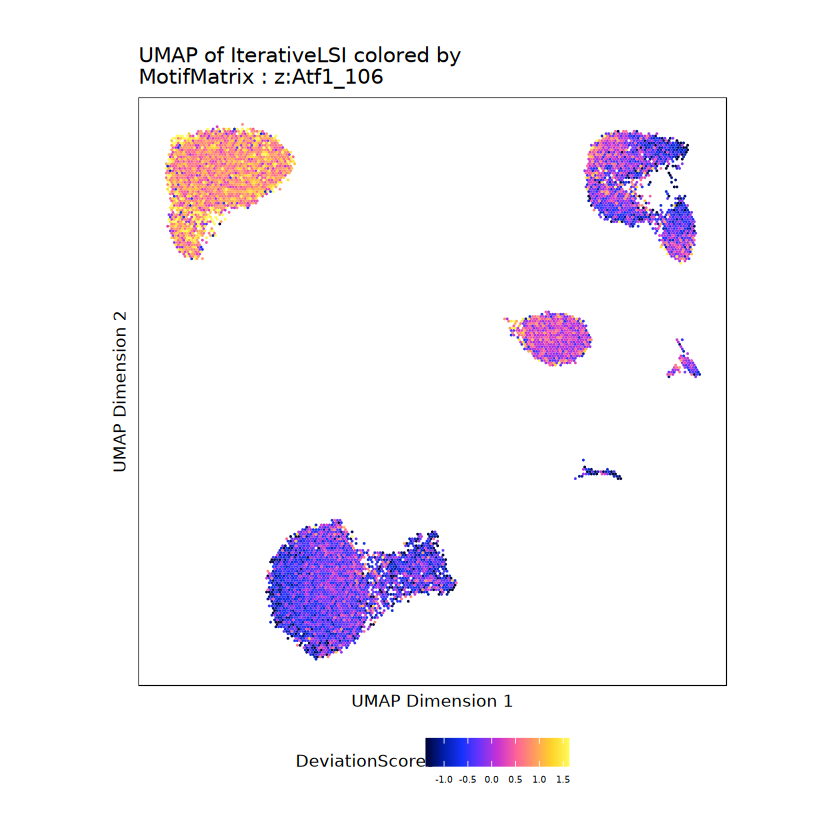

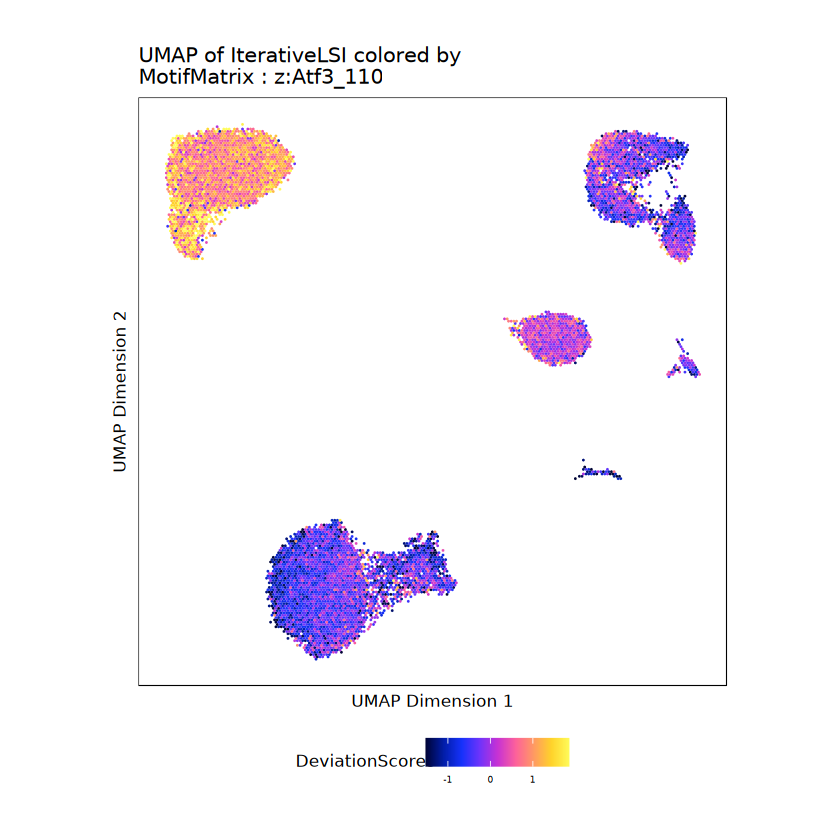

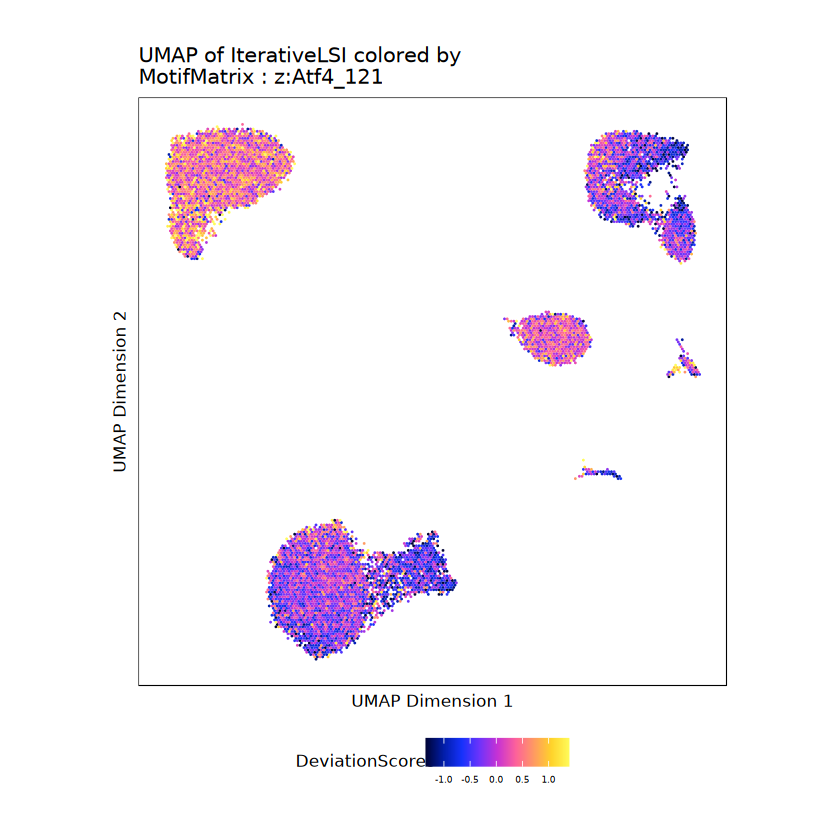

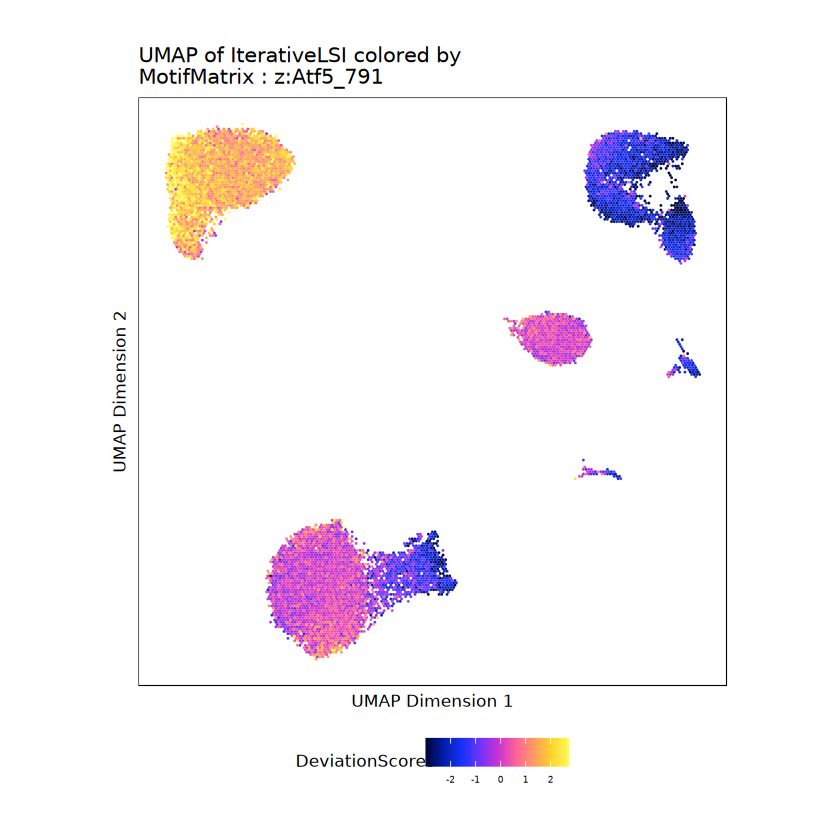

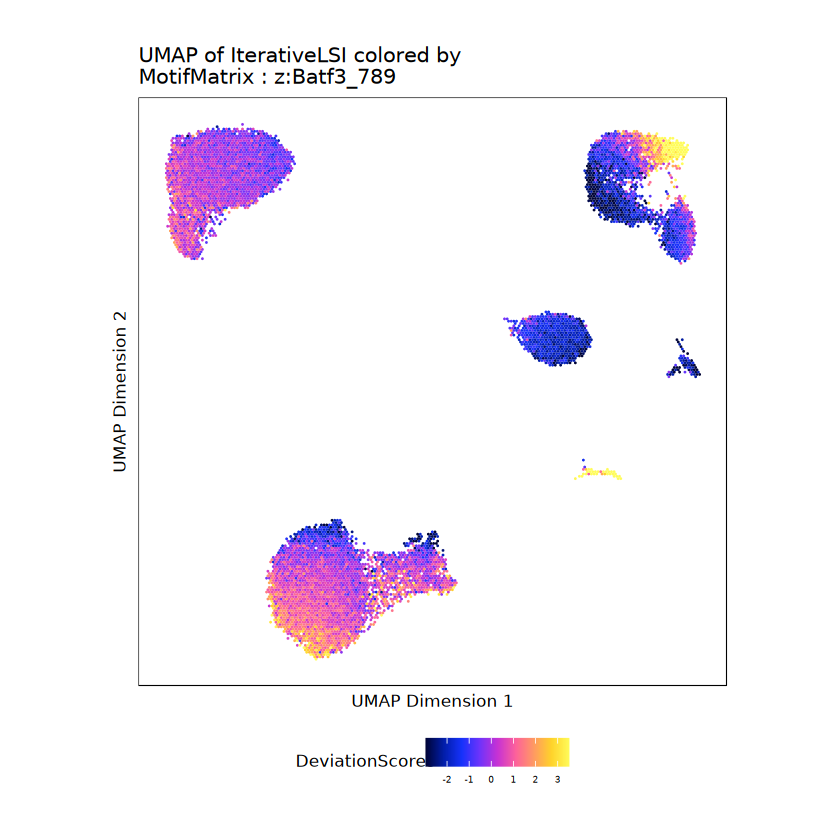

...

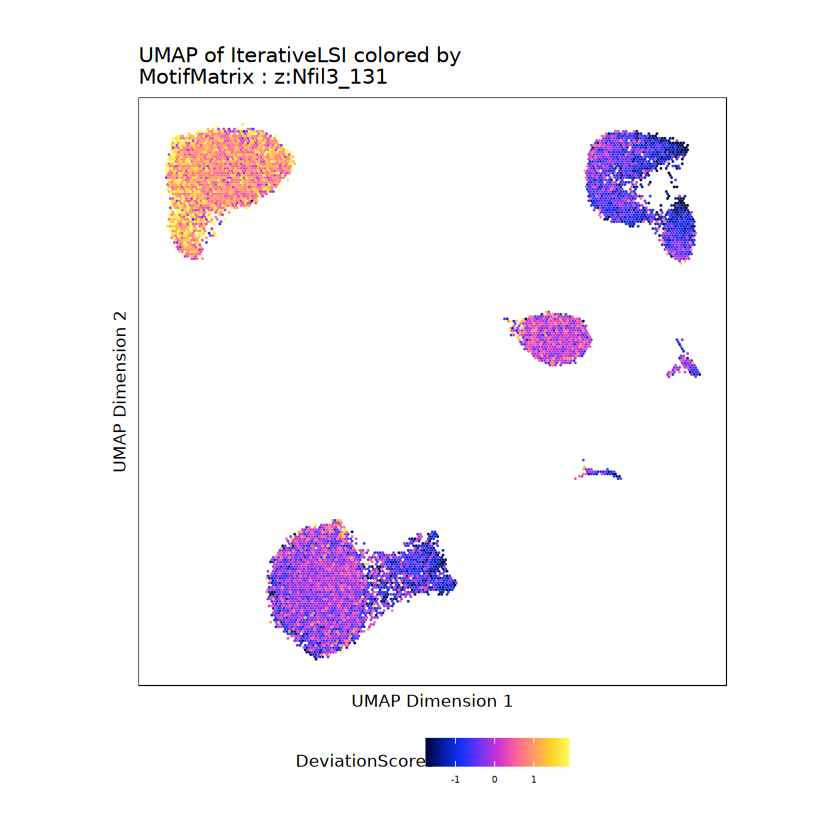

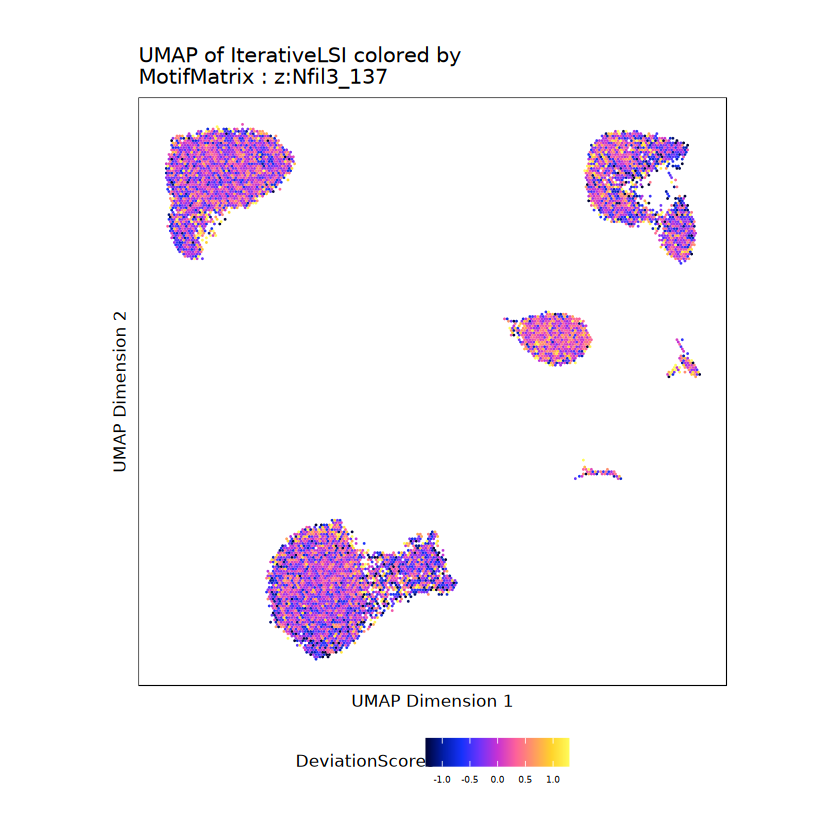

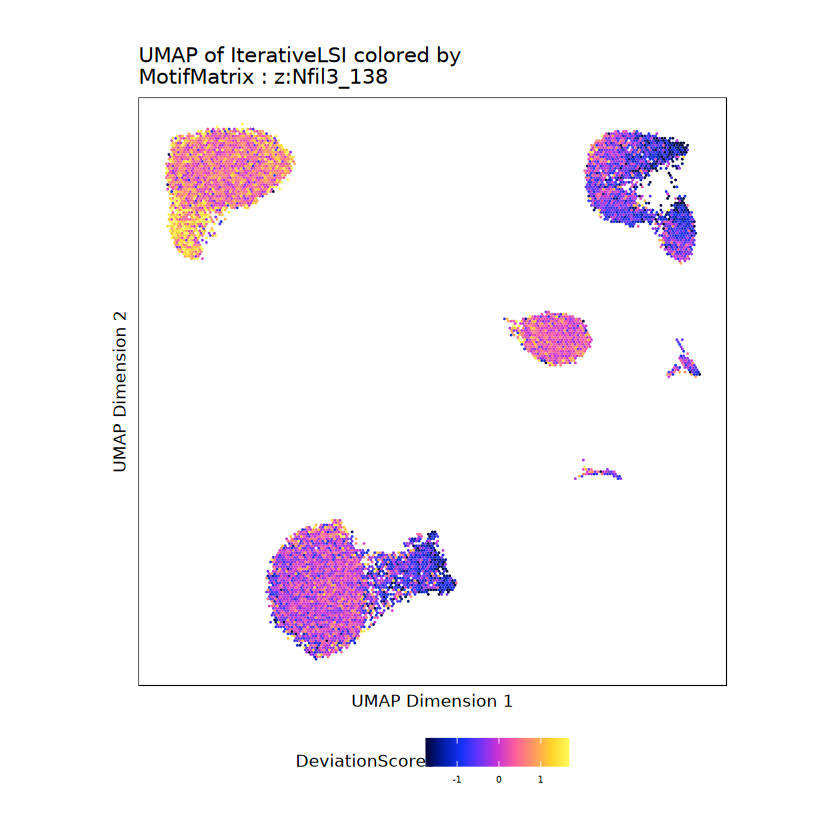

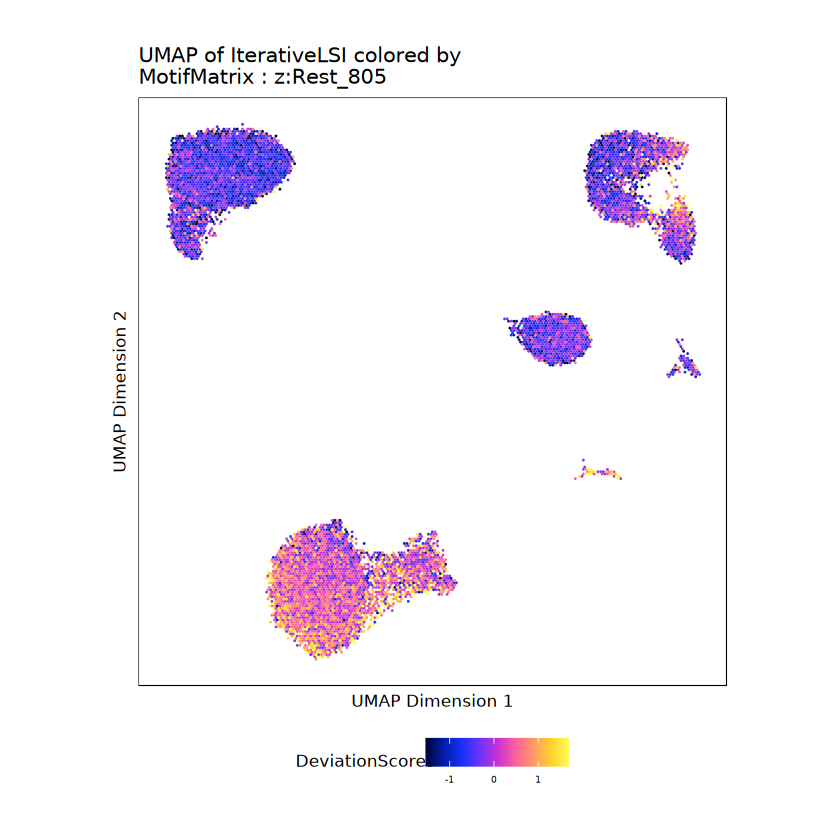

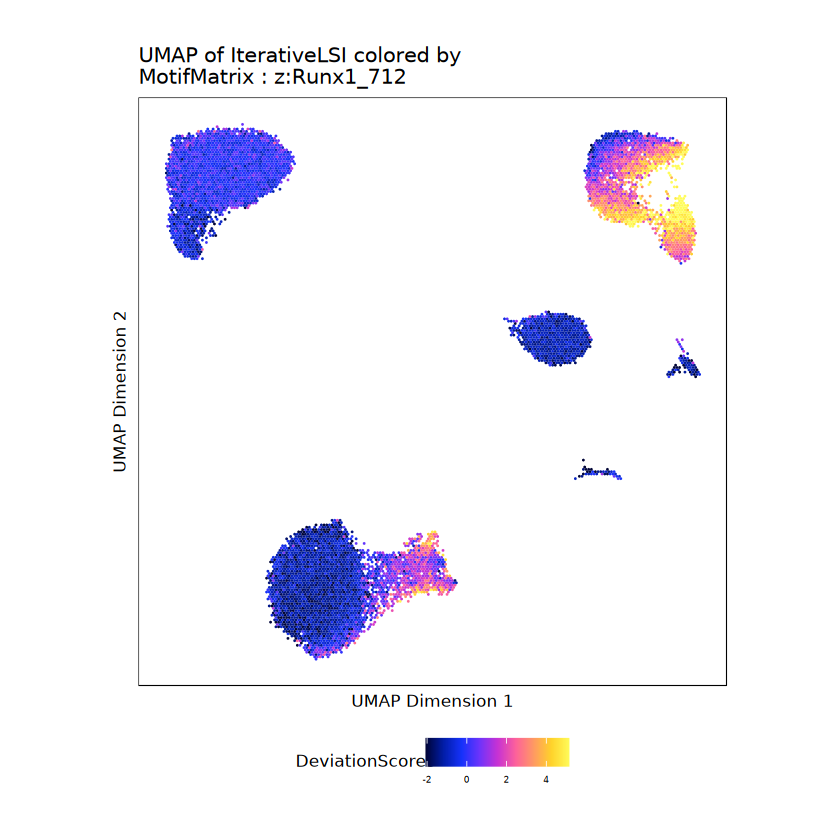

$`z:Atf1_106`

$`z:Atf3_110`

$`z:Atf4_121`

$`z:Atf5_791`

$`z:Batf3_789`

$`z:Bhlhe40_55`

$`z:Bhlhe41_56`

$`z:Cebpb_130`

$`z:Ddit3_788`

$`z:Egr1_190`

$`z:Fos_104`

$`z:Fosb_98`

$`z:Fosl1_107`

$`z:Fosl2_113`

$`z:Jun_126`

$`z:Junb_127`

$`z:Jund_135`

$`z:Mafk_102`

$`z:Nfe2l2_101`

$`z:Nfil3_131`

$`z:Nfil3_137`

$`z:Nfil3_138`

$`z:Rest_805`

$`z:Runx1_712`

$`z:Tgif1_542`

$`z:Usf2_95`


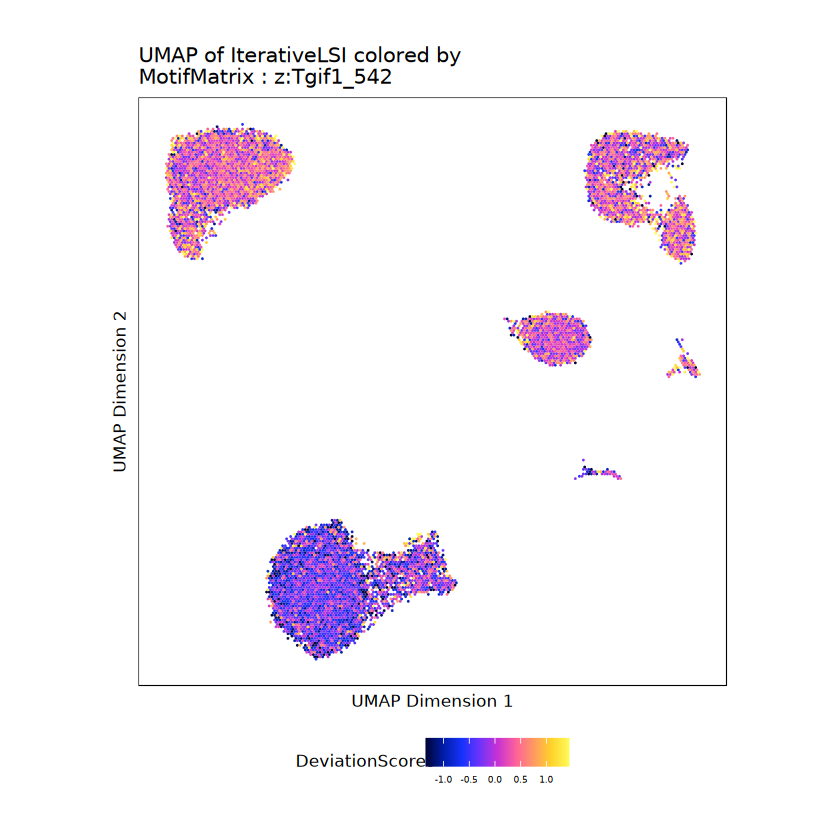

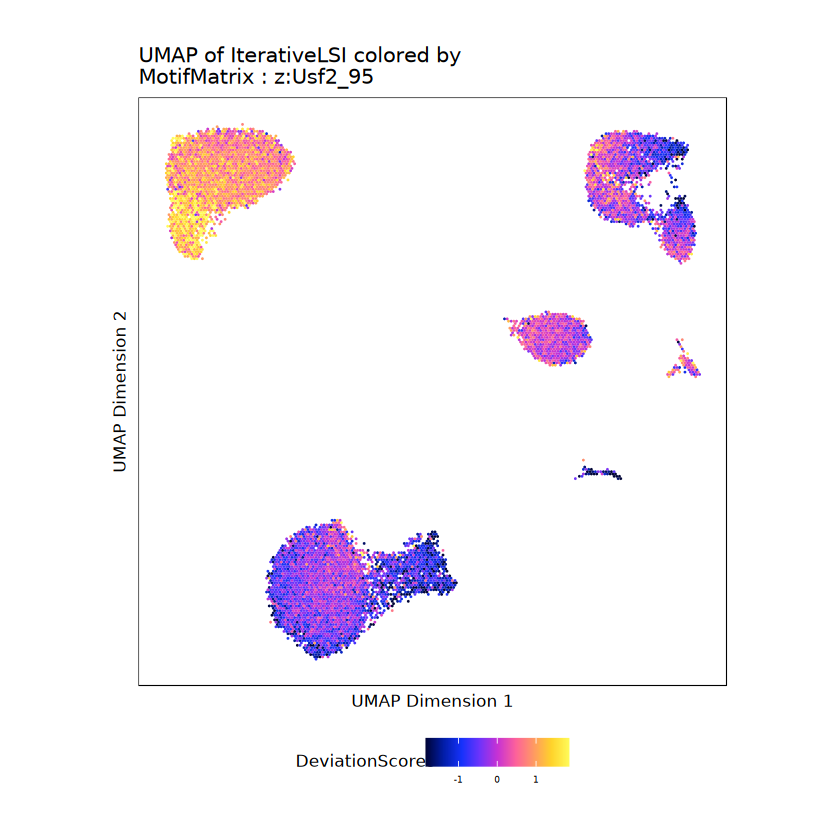

In [27]:
T_TfU <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "MotifMatrix", 
    name = markerMotifs,
    embedding = "UMAP",
    continuousSet = "horizonExtra"
)
T_TfU